In [2]:
from google.colab import files
files.upload()

!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


In [3]:
!kaggle datasets download -d blastchar/telco-customer-churn

!mkdir -p dataset
!unzip telco-customer-churn.zip -d dataset/

Dataset URL: https://www.kaggle.com/datasets/blastchar/telco-customer-churn
License(s): copyright-authors
  0% 0.00/172k [00:00<?, ?B/s]
100% 172k/172k [00:00<00:00, 292MB/s]
Archive:  telco-customer-churn.zip
  inflating: dataset/WA_Fn-UseC_-Telco-Customer-Churn.csv  


In [4]:
!pip install --quiet catboost
!pip install --quiet xgboost
!pip install --quiet optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.9/400.9 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.4/247.4 kB 16.6 MB/s eta 0:00:00


In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns

from matplotlib import cm

# Функции и классы для создания и проверки
from sklearn.base import BaseEstimator, TransformerMixin, ClassifierMixin
from sklearn.utils.validation import (
    validate_data,
    check_X_y,
    check_array,
    check_is_fitted,
    column_or_1d
)
from sklearn.utils.estimator_checks import check_estimator

from sklearn.model_selection import (
    train_test_split,
    cross_validate,
    StratifiedKFold
)
from sklearn import metrics

from sklearn.utils.class_weight import compute_class_weight

from sklearn.preprocessing import (LabelEncoder, OneHotEncoder, StandardScaler)
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.decomposition import PCA

from sklearn.inspection import permutation_importance

from xgboost import XGBClassifier

from catboost import CatBoostClassifier

import optuna

import shap

from itertools import pairwise

from typing import Union

import time

import warnings

In [6]:
# Визуализация всех столбцов в pd.DataFrame
pd.set_option('display.max_columns', None)

import matplotlib_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('retina')

# Постановка проблемы

Цель данной работы - прогнозирование поведения для удержания клиентов. Это является важной задачей, так как потеря клиентов скажется на бизнесе в негативную сторону. Также это может помочь выявить потенциальные слабые места бизнеса для их дальнейшего улучшения.

Даная задача является задачей бинарной классификации.

Основной метрикой качества является pr-auc, так как есть дисбаланс классов и нам необходимо понимать в целом, как работает алгоритм для разных порогов.

Метриками качества являются pr-auc, precision, recall, f1 и AUC-ROC.

Целью будет достичь максимальной метрики pr-auc.

# Загрузка данных

Был выбран датасет для бинарной классификации [Telco Customer Churn](https://www.kaggle.com/datasets/blastchar/telco-customer-churn)

In [7]:
dataset = pd.read_csv("/content/dataset/WA_Fn-UseC_-Telco-Customer-Churn.csv")
dataset.columns = dataset.columns.str.replace('([a-z0-9])([A-Z])', r'\1_\2', regex=True).str.lower()
dataset["total_charges"] = pd.to_numeric(dataset["total_charges"], errors="coerce")

dataset.loc[:, "senior_citizen"] = dataset.loc[:, "senior_citizen"].astype(object)

/tmp/ipython-input-498041917.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0 0 0 ... 0 1 0]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  dataset.loc[:, "senior_citizen"] = dataset.loc[:, "senior_citizen"].astype(object)


In [8]:
dataset.shape

(7043, 21)

In [9]:
dataset.head(3)

,customer_id,gender,senior_citizen,partner,dependents,tenure,phone_service,multiple_lines,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,contract,paperless_billing,payment_method,monthly_charges,total_charges,churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes


In [10]:
dataset.tail(3)

,customer_id,gender,senior_citizen,partner,dependents,tenure,phone_service,multiple_lines,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,contract,paperless_billing,payment_method,monthly_charges,total_charges,churn
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.60,Yes
7042,3186-AJIEK,Male,0,No,No,66,Yes,No,Fiber optic,Yes,No,Yes,Yes,Yes,Yes,Two year,Yes,Bank transfer (automatic),105.65,6844.50,No


In [11]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_id        7043 non-null   object 
 1   gender             7043 non-null   object 
 2   senior_citizen     7043 non-null   object 
 3   partner            7043 non-null   object 
 4   dependents         7043 non-null   object 
 5   tenure             7043 non-null   int64  
 6   phone_service      7043 non-null   object 
 7   multiple_lines     7043 non-null   object 
 8   internet_service   7043 non-null   object 
 9   online_security    7043 non-null   object 
 10  online_backup      7043 non-null   object 
 11  device_protection  7043 non-null   object 
 12  tech_support       7043 non-null   object 
 13  streaming_tv       7043 non-null   object 
 14  streaming_movies   7043 non-null   object 
 15  contract           7043 non-null   object 
 16  paperless_billing  7043 

In [12]:
column_names = dataset.columns.to_numpy()
column_dtypes = dataset.dtypes.to_numpy()
column_unique_values = dataset.nunique()

pd.DataFrame(
    {"dtype": column_dtypes, "unique_values": column_unique_values},
    index=column_names
)

,dtype,unique_values
customer_id,object,7043
gender,object,2
senior_citizen,object,2
partner,object,2
dependents,object,2
tenure,int64,73
phone_service,object,2
multiple_lines,object,3
internet_service,object,3
online_security,object,3


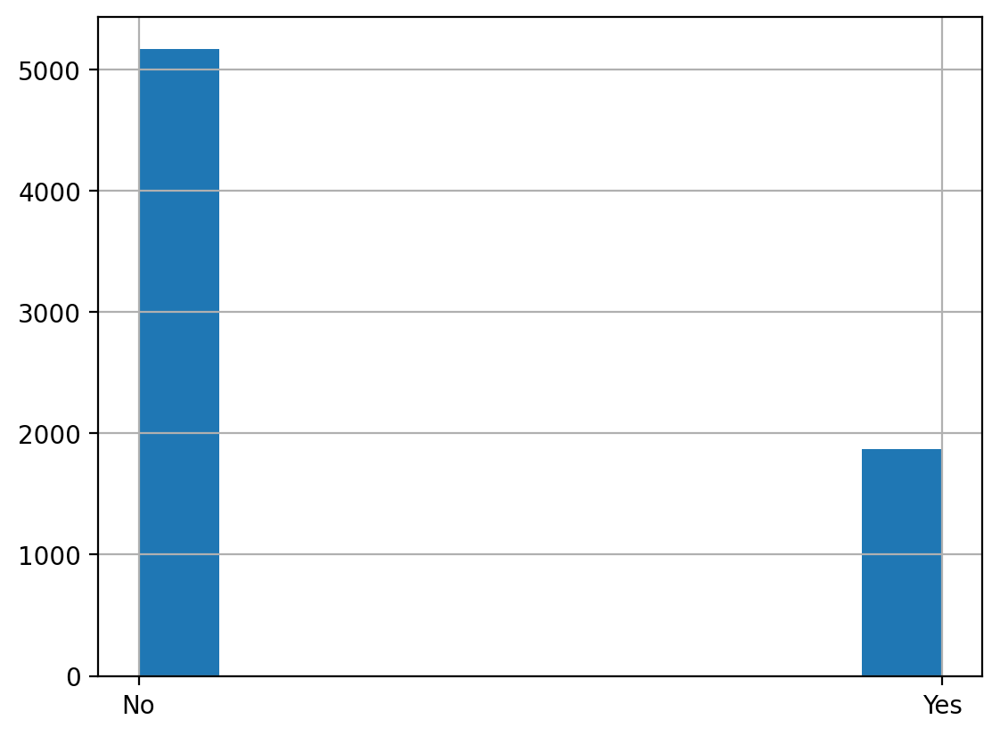

In [13]:
dataset.loc[:, "churn"].hist()

plt.show()

**Выводы:**
* Целью данной работы является предсказание столбца churn. Этот столбец обозначает, уйдет ли клиент в течение месяца или нет
* Каждая строка имеет информацию о клиенте, информацию о услугах, которыми пользуется клиент, информацию о взаимодействии клиента и компании
* Датасет имеет 7043 строк и 21 столбец
* В датасете присутствует дисбаланс классов. Это необходимо учесть в будущем
* Большинство признаков являются категориальными
* Есть немного пропущенных значений

Описание колонок датасета:  

| Поле              | Описание                                                                                                |
|-------------------|---------------------------------------------------------------------------------------------------------|
| customerID        | Уникальный идентификатор клиента                                                                        |
| gender            | Пол клиента (мужчина/женщина)                                                                           |
| SeniorCitizen     | Является ли клиент пенсионером (1 - да, 0 - нет)                                                        |
| Partner           | Наличие партнёра у клиента (Да/Нет)                                                                     |
| Dependents        | Наличие иждивенцев у клиента (Да/Нет)                                                                   |
| tenure            | Количество месяцев обслуживания клиента в компании                                                      |
| PhoneService      | Наличие телефонной услуги (Да/Нет)                                                                      |
| MultipleLines     | Наличие нескольких телефонных линий (Да/Нет/Нет телефонной услуги)                                      |
| InternetService   | Провайдер интернет-услуг (DSL/Волоконная оптика/Нет)                                                    |
| OnlineSecurity    | Наличие онлайн-защиты (Да/Нет/Нет интернет-услуги)                                                      |
| OnlineBackup      | Наличие онлайн-резервного копирования (Да/Нет/Нет интернет-услуги)                                      |
| DeviceProtection  | Наличие защиты устройства (Да/Нет/Нет интернет-услуги)                                                  |
| TechSupport       | Наличие техподдержки (Да/Нет/Нет интернет-услуги)                                                       |
| StreamingTV       | Наличие стримингового TV (Да/Нет/Нет интернет-услуги)                                                   |
| StreamingMovies   | Наличие стриминговых фильмов (Да/Нет/Нет интернет-услуги)                                               |
| Contract          | Тип контракта (Помесячный/Один год/Два года)                                                            |
| PaperlessBilling  | Использование безбумажного биллинга (Да/Нет)                                                            |
| PaymentMethod     | Способ оплаты (Электронный чек/Почтовый чек/Банковский перевод (авто)/Кредитная карта (авто))            |
| MonthlyCharges    | Ежемесячные платежи клиента                                                                             |
| TotalCharges      | Общая сумма платежей клиента                                                                            |
| Churn             | Факт оттока клиента (Да/Нет)                                                                            |

# EDA

In [14]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_id        7043 non-null   object 
 1   gender             7043 non-null   object 
 2   senior_citizen     7043 non-null   object 
 3   partner            7043 non-null   object 
 4   dependents         7043 non-null   object 
 5   tenure             7043 non-null   int64  
 6   phone_service      7043 non-null   object 
 7   multiple_lines     7043 non-null   object 
 8   internet_service   7043 non-null   object 
 9   online_security    7043 non-null   object 
 10  online_backup      7043 non-null   object 
 11  device_protection  7043 non-null   object 
 12  tech_support       7043 non-null   object 
 13  streaming_tv       7043 non-null   object 
 14  streaming_movies   7043 non-null   object 
 15  contract           7043 non-null   object 
 16  paperless_billing  7043 

In [15]:
dataset[dataset.isna().any(axis=1)]

,customer_id,gender,senior_citizen,partner,dependents,tenure,phone_service,multiple_lines,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,contract,paperless_billing,payment_method,monthly_charges,total_charges,churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,No,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,NaN,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,NaN,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,Yes,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,NaN,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,NaN,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,Yes,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,NaN,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,NaN,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,NaN,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,NaN,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,NaN,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,NaN,No


In [16]:
dataset.loc[(dataset.loc[:, "tenure"] == 0)]

,customer_id,gender,senior_citizen,partner,dependents,tenure,phone_service,multiple_lines,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,contract,paperless_billing,payment_method,monthly_charges,total_charges,churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,No,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,NaN,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,NaN,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,Yes,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,NaN,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,NaN,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,Yes,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,NaN,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,NaN,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,NaN,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,NaN,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,NaN,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,NaN,No


In [17]:
dataset.loc[dataset.loc[:, "total_charges"].isna()]

,customer_id,gender,senior_citizen,partner,dependents,tenure,phone_service,multiple_lines,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,contract,paperless_billing,payment_method,monthly_charges,total_charges,churn
488,4472-LVYGI,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,No,Yes,Yes,Yes,No,Two year,Yes,Bank transfer (automatic),52.55,NaN,No
753,3115-CZMZD,Male,0,No,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.25,NaN,No
936,5709-LVOEQ,Female,0,Yes,Yes,0,Yes,No,DSL,Yes,Yes,Yes,No,Yes,Yes,Two year,No,Mailed check,80.85,NaN,No
1082,4367-NUYAO,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.75,NaN,No
1340,1371-DWPAZ,Female,0,Yes,Yes,0,No,No phone service,DSL,Yes,Yes,Yes,Yes,Yes,No,Two year,No,Credit card (automatic),56.05,NaN,No
3331,7644-OMVMY,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.85,NaN,No
3826,3213-VVOLG,Male,0,Yes,Yes,0,Yes,Yes,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,25.35,NaN,No
4380,2520-SGTTA,Female,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,20.00,NaN,No
5218,2923-ARZLG,Male,0,Yes,Yes,0,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,One year,Yes,Mailed check,19.70,NaN,No
6670,4075-WKNIU,Female,0,Yes,Yes,0,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,No,Two year,No,Mailed check,73.35,NaN,No


In [18]:
dataset.loc[:, "total_charges"] = dataset.loc[:, "total_charges"].fillna(0)

**Выводы:**
* Пустые значения в total_charges обозначают нового клиента, который ничего не платил, следовательно можно заполнить данную колонку 0.

In [19]:
def visualize_cat_features(
        x: str=None,
        hue="churn",
        max_bin=True,
        make_distribution=False
    ):
    fig, ax = plt.subplots(ncols=2, figsize=(12, 5))

    if max_bin:
        sns.histplot(
            train_dataset,
            x=x,
            hue=hue,
            bins=train_dataset.loc[:, "tenure"].nunique(),
            ax=ax[0])
    else:
        sns.histplot(
            train_dataset,
            x=x,
            hue=hue,
            ax=ax[0])
    ax[0].set_title(f"Распледение {x} относительно {hue}")
    ax[0].tick_params(axis='x', rotation=30)

    if make_distribution:
        distribution = train_dataset.groupby(x)[hue].value_counts(normalize=True).unstack()

        distribution.plot(kind='bar',
                        stacked=True,
                        color=['skyblue', 'salmon'],
                        ax=ax[1],
                        edgecolor='black')

        ax[1].set_title(f'Распределение оттока по {x}')
        ax[1].set_xlabel(x)
        ax[1].set_ylabel('Доля клиентов')
        ax[1].legend(title='Churn', loc='upper right', labels=['No', 'Yes'])
        ax[1].set_xticklabels(distribution.index, rotation=30)

        for bars in ax[1].containers:
            ax[1].bar_label(bars, label_type='center', fmt='%.3f%%', padding=2)
    else:
        ax[1].set_axis_off()

    plt.tight_layout()
    plt.show()

In [20]:
train_dataset, temp = train_test_split(dataset,
                                               test_size=0.2,
                                               stratify=dataset.loc[:, "churn"],
                                               shuffle=True)
val_dataset, test_dataset = train_test_split(temp,
                                               test_size=0.5,
                                               stratify=temp.loc[:, "churn"],
                                               shuffle=True)

In [21]:
print(f"Размер train set: {train_dataset.shape}")
print(f"Размер val set: {val_dataset.shape}")
print(f"Размер test set: {test_dataset.shape}")

Размер train set: (5634, 21)
Размер val set: (704, 21)
Размер test set: (705, 21)


In [22]:
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5634 entries, 24 to 6795
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_id        5634 non-null   object 
 1   gender             5634 non-null   object 
 2   senior_citizen     5634 non-null   object 
 3   partner            5634 non-null   object 
 4   dependents         5634 non-null   object 
 5   tenure             5634 non-null   int64  
 6   phone_service      5634 non-null   object 
 7   multiple_lines     5634 non-null   object 
 8   internet_service   5634 non-null   object 
 9   online_security    5634 non-null   object 
 10  online_backup      5634 non-null   object 
 11  device_protection  5634 non-null   object 
 12  tech_support       5634 non-null   object 
 13  streaming_tv       5634 non-null   object 
 14  streaming_movies   5634 non-null   object 
 15  contract           5634 non-null   object 
 16  paperless_billing  5634 non-

In [23]:
np.round(train_dataset.describe(
    percentiles=[0.01, 0.05, 0.25, 0.5, 0.75, 0.95, 0.99],
    include=np.number), 3)

,tenure,monthly_charges,total_charges
count,5634.000,5634.000,5634.000
mean,32.334,64.896,2283.439
std,24.550,29.990,2259.764
min,0.000,18.250,0.000
1%,1.000,19.200,19.800
5%,1.000,19.650,48.582
25%,9.000,35.750,389.838
50%,29.000,70.450,1395.525
75%,55.000,89.850,3823.762
95%,71.000,106.800,6877.730


In [24]:
train_dataset.describe(include=object)

,customer_id,gender,senior_citizen,partner,dependents,phone_service,multiple_lines,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,contract,paperless_billing,payment_method,churn
count,5634,5634,5634,5634,5634,5634,5634,5634,5634,5634,5634,5634,5634,5634,5634,5634,5634,5634
unique,5634,2,2,2,2,2,3,3,3,3,3,3,3,3,3,2,4,2
top,3541-ZNUHK,Male,0,No,No,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,No
freq,1,2876,4674,2934,3972,5086,2704,2501,2823,2468,2482,2801,2268,2252,3116,3338,1904,4139


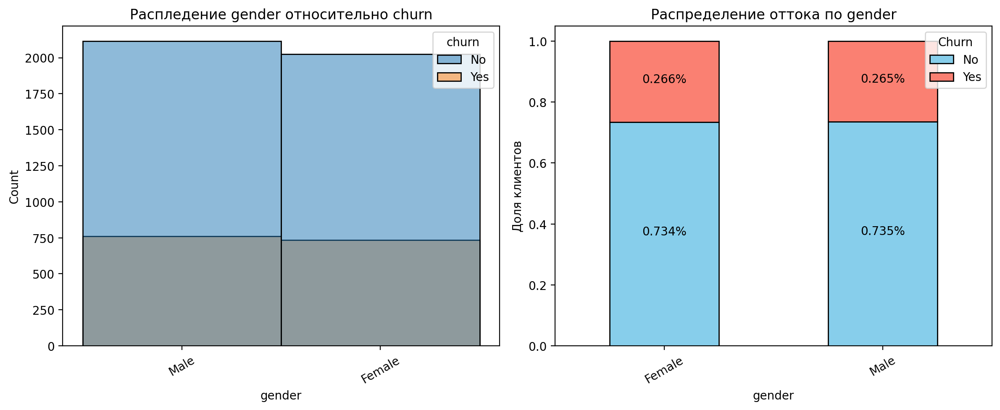

In [25]:
visualize_cat_features("gender", max_bin=False, make_distribution=True)

Пол не влияет на то, уходит ли клиент

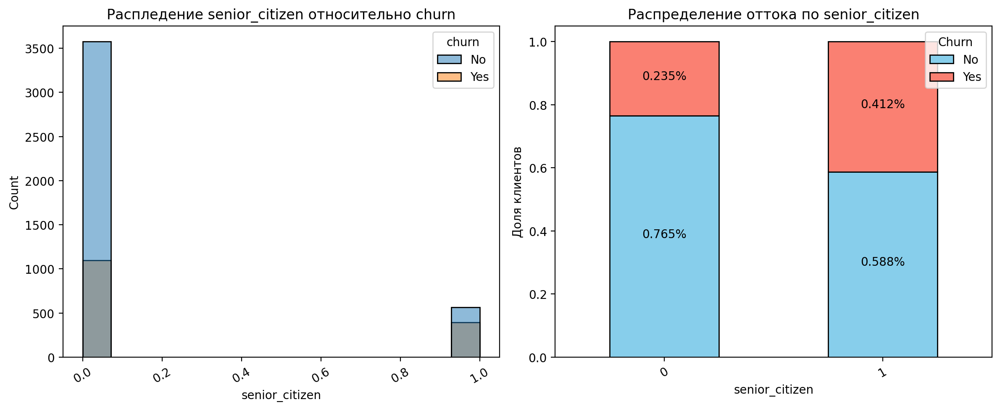

In [26]:
visualize_cat_features("senior_citizen", max_bin=False, make_distribution=True)

Молодежь менее охотно уходит, чем пенсионеры

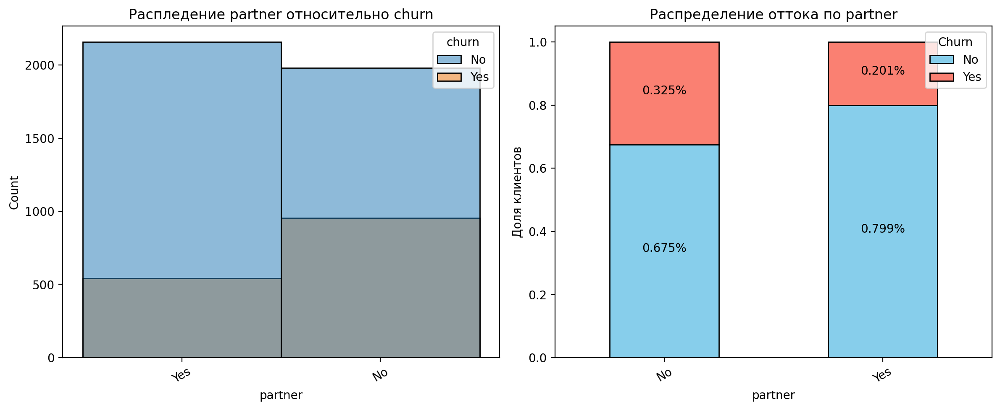

In [27]:
visualize_cat_features("partner", max_bin=True, make_distribution=True)

Клиенты без партнера чуть активнее уходят

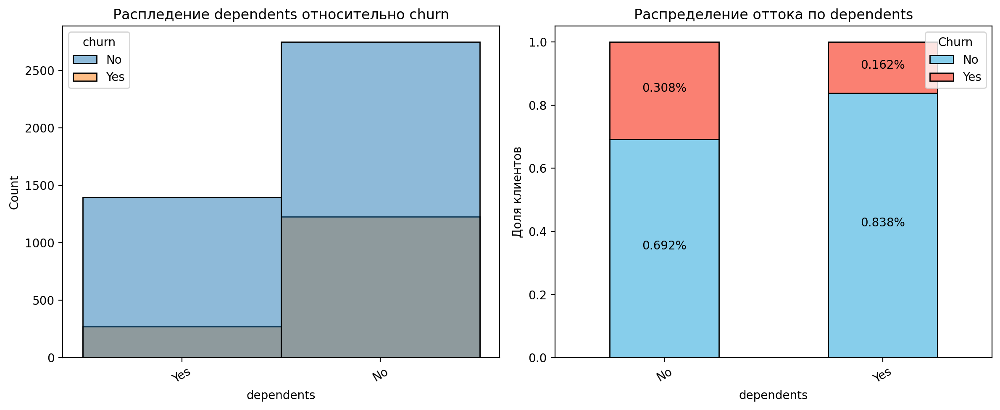

In [28]:
visualize_cat_features("dependents", max_bin=True, make_distribution=True)

Клиенты с иждивенцами уходят сильно реже, чем клиенты без

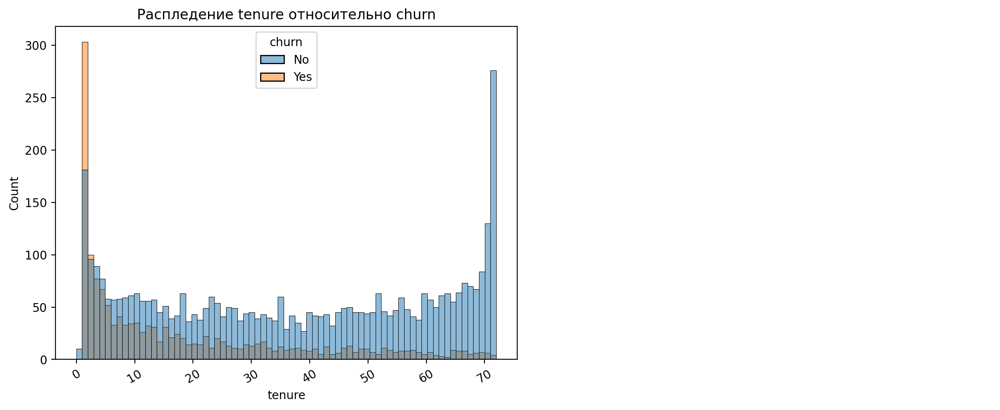

In [29]:
visualize_cat_features("tenure", max_bin=True)

Новые клиенты чаще уходят. При этом, чем дольше клиент находится в компании, тем меньше вероятность, что он уйдет.

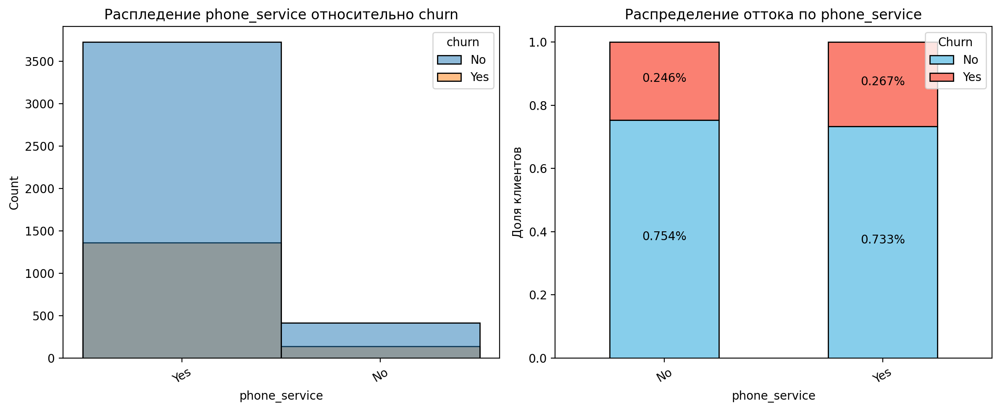

In [30]:
visualize_cat_features("phone_service", max_bin=True, make_distribution=True)

Наличие телефонной услуги не влияет на уход клиента из компании

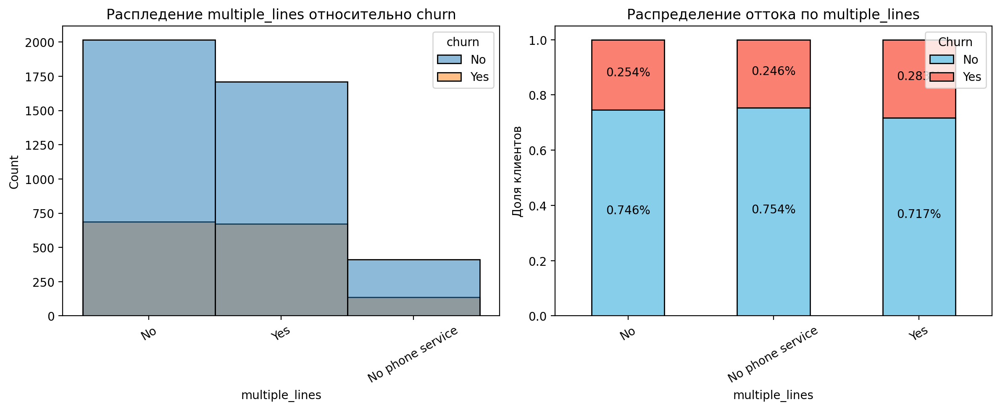

In [31]:
visualize_cat_features("multiple_lines", max_bin=True, make_distribution=True)

Наличие нескольких телефонных линий не особо влияет на уход клиента из компании

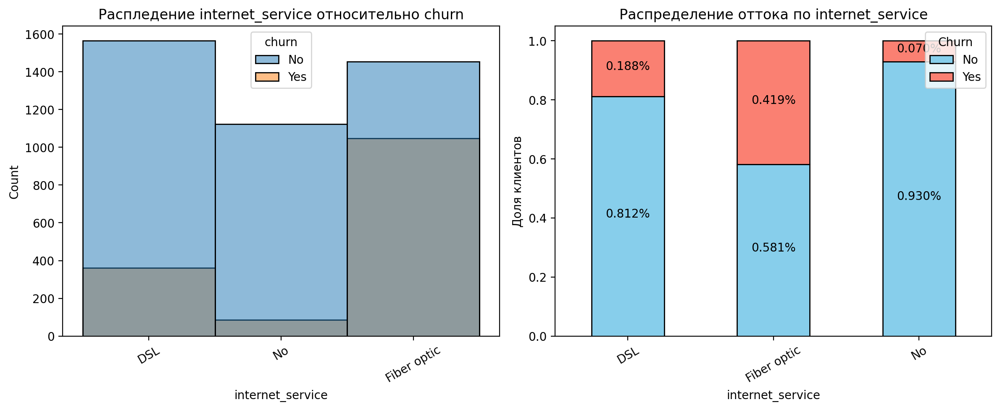

In [32]:
visualize_cat_features("internet_service", max_bin=True, make_distribution=True)

Наличие провайдера интернет-услуг сильно увечивает возможность ухода клиента из компании

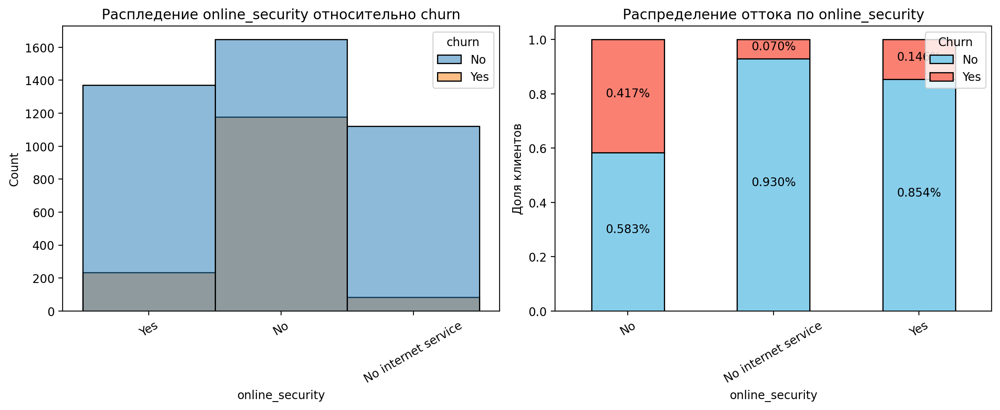

In [33]:
visualize_cat_features("online_security", max_bin=True, make_distribution=True)

Отсутствие онлайн-защиты при условии наличия интернета сильно увеличивает возможность ухода клиента из компании

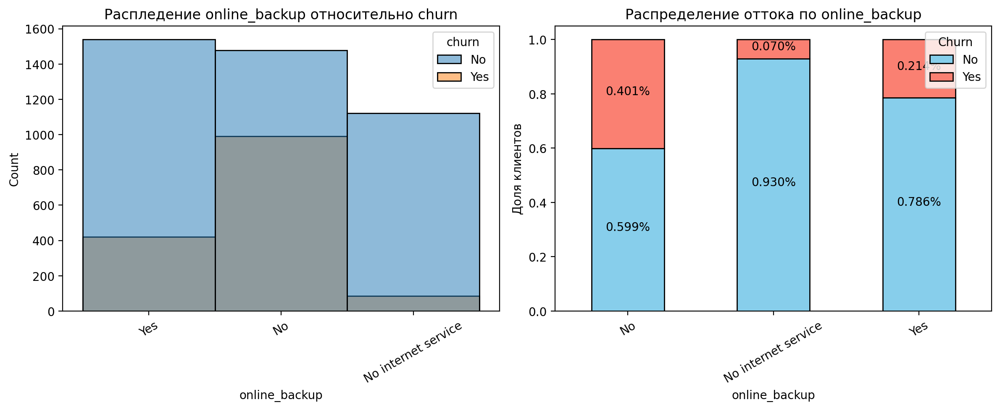

In [34]:
visualize_cat_features("online_backup", max_bin=True, make_distribution=True)

Отсутствие онлайн-резервного копирования при условии наличия интернета сильно увеличивает возможность ухода клиента из компании

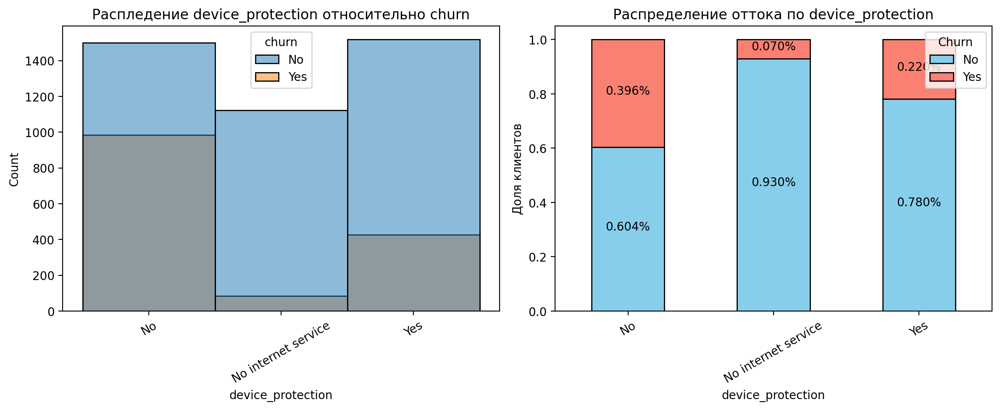

In [35]:
visualize_cat_features("device_protection", max_bin=True, make_distribution=True)

Отсутствие защиты устройства при условии наличия интернета сильно увеличивает возможность ухода клиента из компании

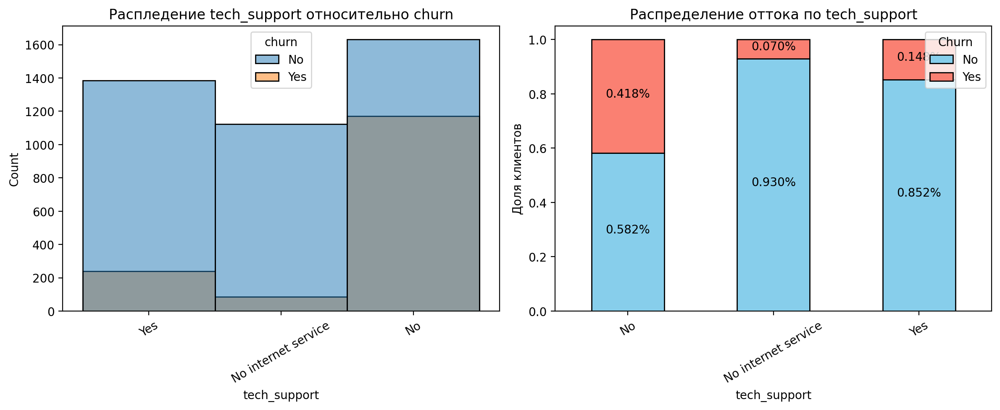

In [36]:
visualize_cat_features("tech_support", max_bin=True, make_distribution=True)

Отсутствие техподдержки при условии наличия интернета сильно увеличивает возможность ухода клиента из компании

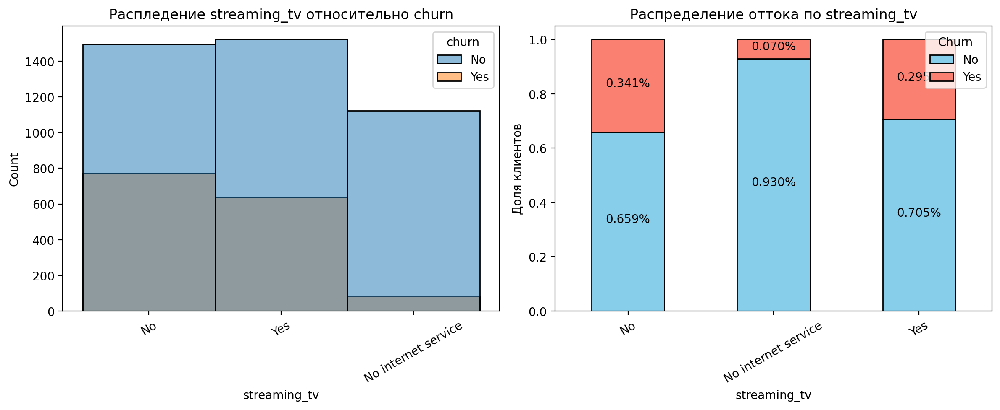

In [37]:
visualize_cat_features("streaming_tv", max_bin=True, make_distribution=True)

Наличие стримингового TV в целом сильно увеличивает возможность ухода клиента из компании

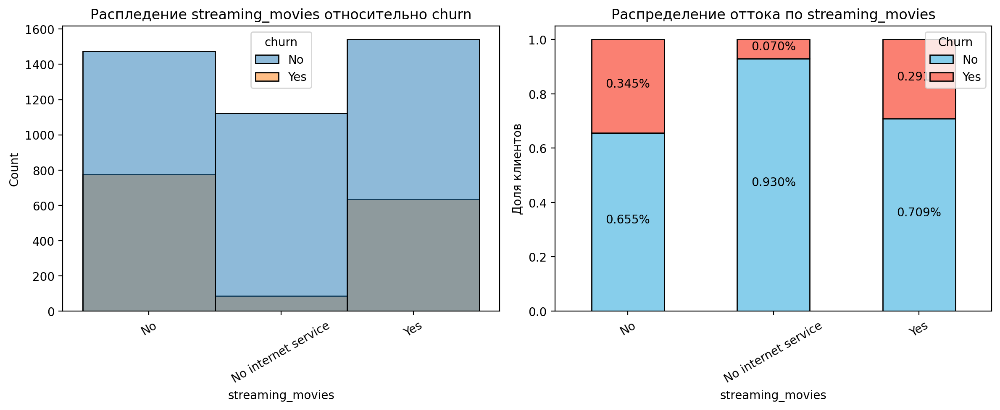

In [38]:
visualize_cat_features("streaming_movies", max_bin=True, make_distribution=True)

Наличие стриминговых фильмов в целом сильно увеличивает возможность ухода клиента из компании

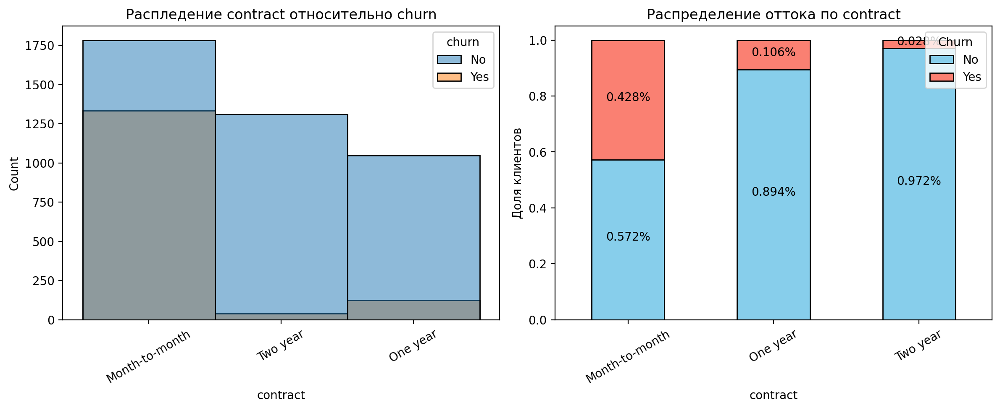

In [39]:
visualize_cat_features("contract", max_bin=True, make_distribution=True)

Тип контракта в целом сильно увеличивает возможность ухода клиента из компании. Скорее всего это связано с тем, что как только клиент становится не довольным, он практически сразу (после завершения месячного контракта) уходит в другую компанию

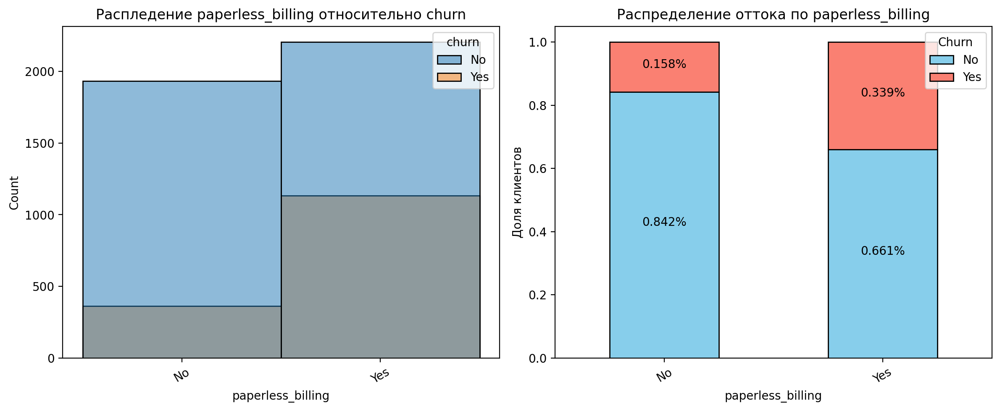

In [40]:
visualize_cat_features("paperless_billing", max_bin=True, make_distribution=True)

Клиенты, выбравшие использование безбумажного биллинга, уходят чаще

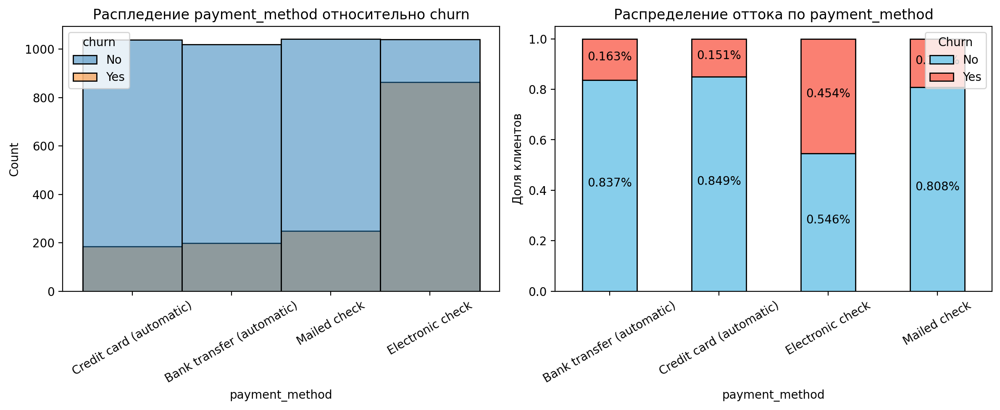

In [41]:
visualize_cat_features("payment_method", max_bin=True, make_distribution=True)

44% клиентов с электронным чеком уходят из компании

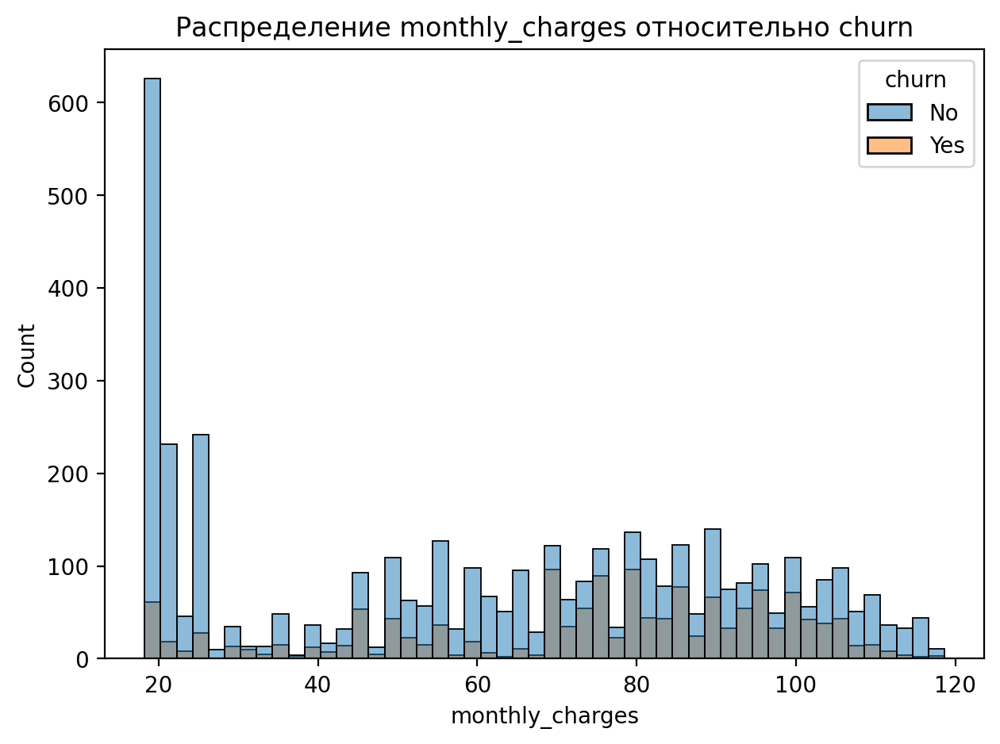

In [42]:
fig, ax = plt.subplots()

sns.histplot(
    train_dataset,
    x="monthly_charges",
    hue="churn",
    bins=50,
    ax=ax)
ax.set_title("Распределение monthly_charges относительно churn")

plt.tight_layout()
plt.show()

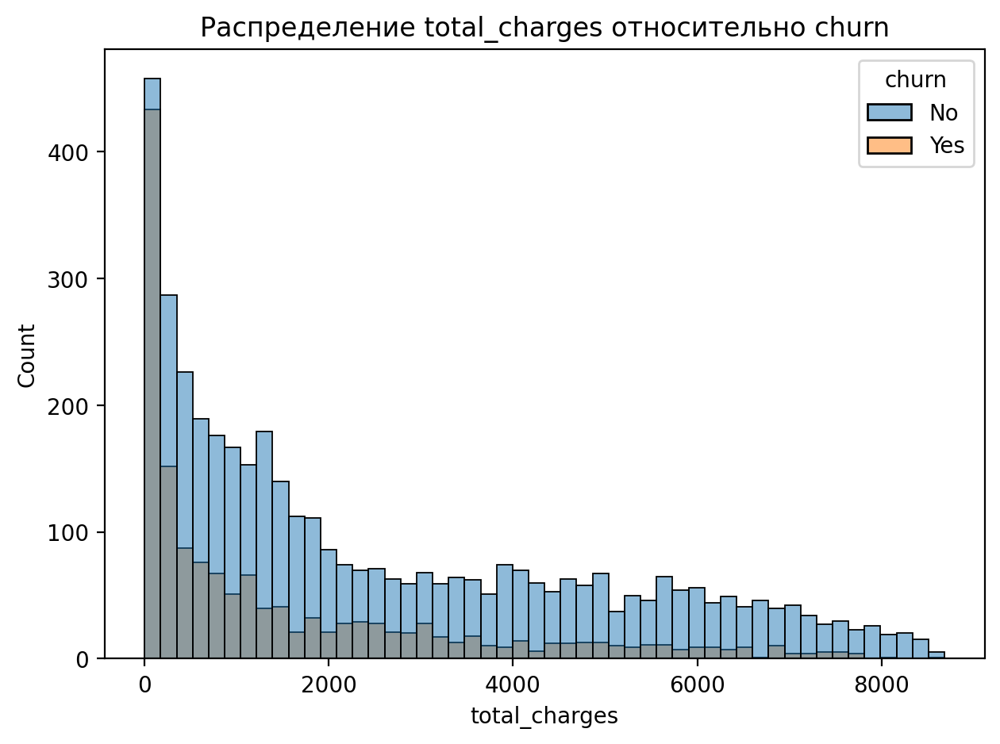

In [43]:
fig, ax = plt.subplots()

sns.histplot(
    train_dataset,
    x="total_charges",
    hue="churn",
    bins=50,
    ax=ax)
ax.set_title("Распределение total_charges относительно churn")

plt.tight_layout()
plt.show()

In [44]:
bin_split = np.linspace(0, 9000, 19, dtype=int)

bin_names = list(pairwise(bin_split))
bin_names = np.array([f"[{int(a)}, {int(b)})" for a, b in bin_names])

bin_idx_list = np.digitize(train_dataset.loc[:, "total_charges"].to_numpy(), bins=bin_split)

In [45]:
bin_split

array([   0,  500, 1000, 1500, 2000, 2500, 3000, 3500, 4000, 4500, 5000,
       5500, 6000, 6500, 7000, 7500, 8000, 8500, 9000])

In [46]:
bin_names[bin_idx_list-1]

array(['[2500, 3000)', '[500, 1000)', '[500, 1000)', ..., '[0, 500)',
       '[500, 1000)', '[4500, 5000)'], dtype='<U12')

In [47]:
temp_dataset = train_dataset.loc[:, ["tenure", "monthly_charges", "total_charges", "churn"]].copy()
temp_dataset["total_charges_bins"] = bin_names[bin_idx_list-1]
temp_dataset.head(3)

,tenure,monthly_charges,total_charges,churn,total_charges_bins
24,49,59.6,2970.30,No,"[2500, 3000)"
4391,9,59.5,530.05,No,"[500, 1000)"
4953,29,19.4,554.25,No,"[500, 1000)"


In [48]:
temp_dataset.groupby(["total_charges_bins", "churn"])[["monthly_charges", "tenure"]].mean()

monthly_charges     tenure
total_charges_bins churn                            
[0, 500)           No           36.525711   7.208641
                   Yes          60.568003   2.788200
[1000, 1500)       No           41.334576  41.012422
                   Yes          80.858333  16.746377
[1500, 2000)       No           53.590968  42.293548
                   Yes          84.332099  21.444444
[2000, 2500)       No           69.239573  35.260664
                   Yes          83.787654  28.481481
[2500, 3000)       No           73.366851  40.303867
                   Yes          84.604032  33.919355
[3000, 3500)       No           73.370492  46.825137
                   Yes          87.823636  37.636364
[3500, 4000)       No           78.240782  50.469274
                   Yes          89.516667  43.212121
[4000, 4500)       No           80.172881  54.604520
                   Yes          91.175000  46.600000
[4500, 5000)       No           84.062570  58.022346
                   Yes          97.780556  48.888889
[500, 1000)        No           42.671627  23.926587
                   Yes          75.027411  11.111675
[5000, 5500)       No           90.702632  59.097744
                   Yes          98.023333  54.333333
[5500, 6000)       No           91.310976  63.682927
                   Yes          99.438462  57.423077
[6000, 6500)       No           93.927239  66.649254
                   Yes         102.459615  61.115385
[6500, 7000)       No          100.889344  67.032787
                   Yes         103.650000  65.500000
[7000, 7500)       No          106.215979  68.051546
                   Yes         106.427273  68.363636
[7500, 8000)       No          109.422368  70.776316
                   Yes         110.225000  69.500000
[8000, 8500)       No          114.609615  71.653846
                   Yes         115.550000  70.000000
[8500, 9000)       No          116.990000  71.800000
                   Yes         117.800000  72.000000

Клиенты, которые с самого начала платят много, чаще уходят быстро

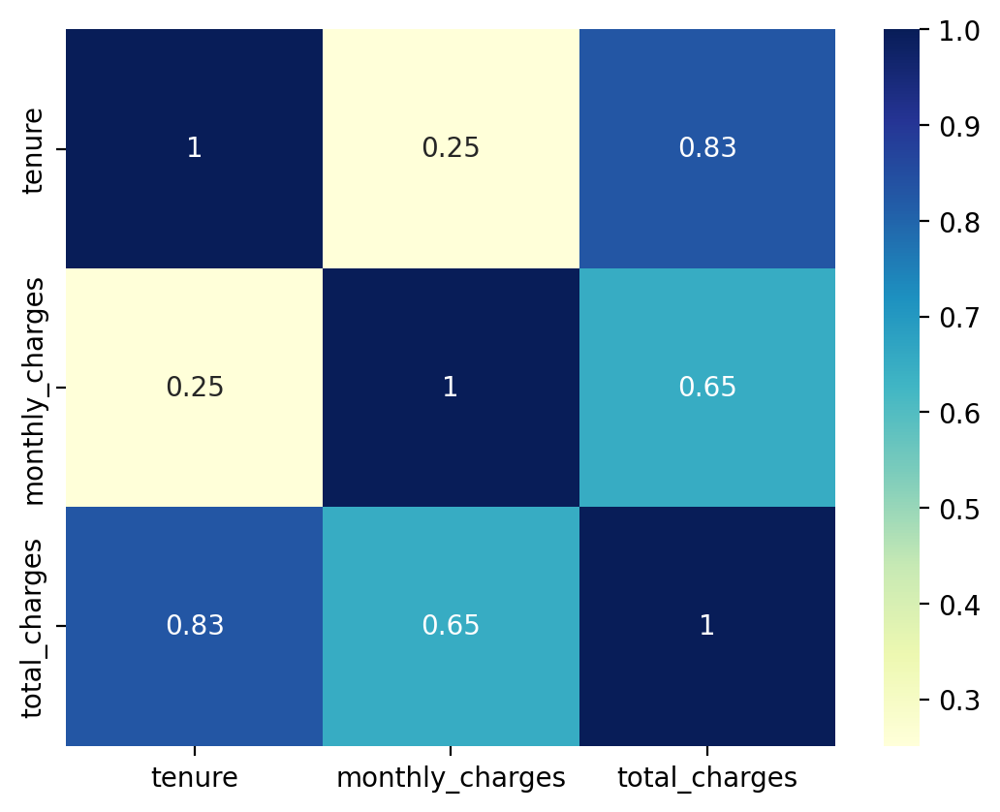

In [49]:
co_mtx = train_dataset.corr(numeric_only=True)

sns.heatmap(co_mtx, cmap="YlGnBu", annot=True)

plt.show()

In [50]:
# custom_palette = ["#1f77b4", "#2ca02c", "#fac205"]
custom_palette = ["#33BBEE", "#EE7733"]

In [51]:
feature_list = train_dataset.select_dtypes(include=np.number).columns.to_list()
num_features = len(feature_list)
feature_list

['tenure', 'monthly_charges', 'total_charges']

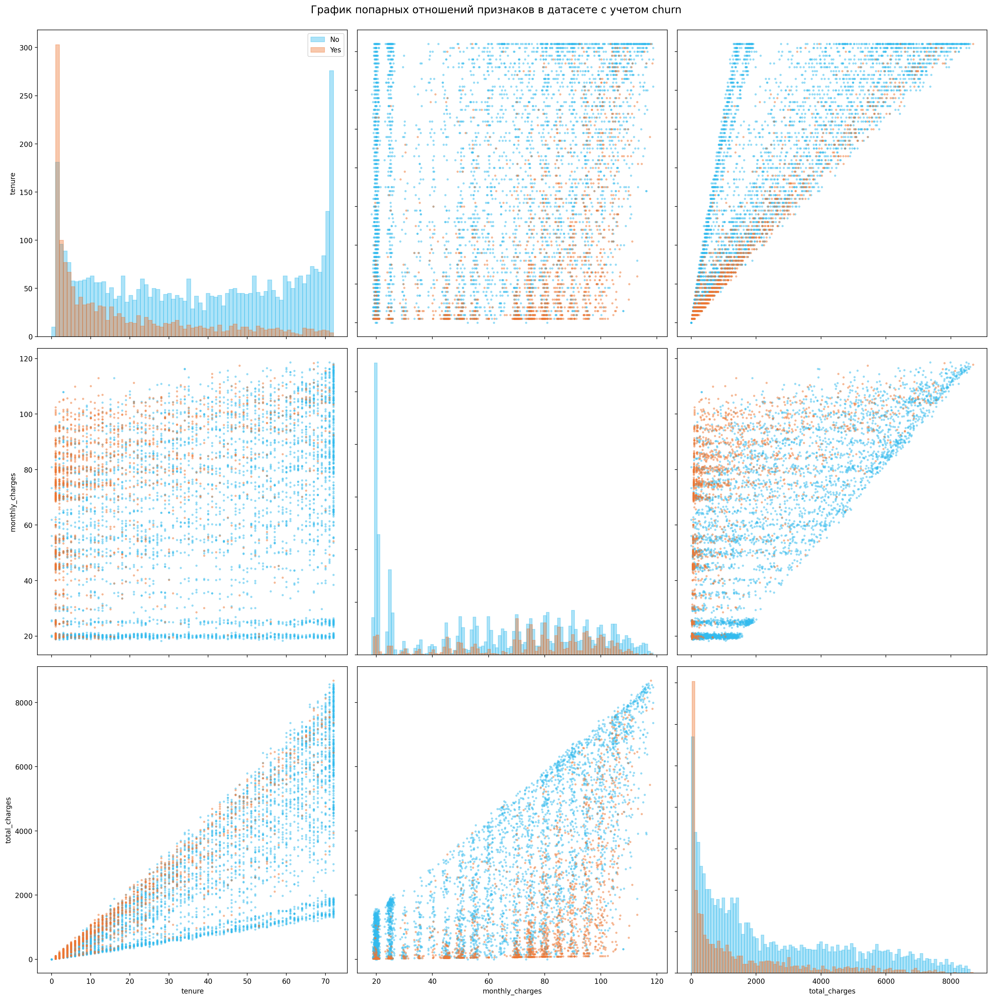

In [52]:
column_name = "churn"
unique_id_list = np.unique(train_dataset.loc[:, column_name])

fig, ax = plt.subplots(ncols=num_features, nrows=num_features, figsize=(20, 20))

for idx1, feature1 in enumerate(feature_list):
    for idx2, feature2 in enumerate(feature_list):
        if feature1 == feature2:
            # график самого признака
            for unique_id, color in zip(unique_id_list, custom_palette):
                temp_ = train_dataset.loc[train_dataset.loc[:, column_name]==unique_id, feature1].to_numpy()
                ax[idx1, idx2].hist(temp_,
                        color=color,
                        edgecolor=color,
                        bins=min(100, len(np.unique(temp_))),
                        alpha=0.4)
        else:
            # scatter
            for unique_id, color in zip(unique_id_list, custom_palette):
                temp_1 = train_dataset.loc[dataset.loc[:, column_name]==unique_id, feature1].to_numpy()
                temp_2 = train_dataset.loc[dataset.loc[:, column_name]==unique_id, feature2].to_numpy()
                ax[idx1, idx2].scatter(
                    temp_2,
                    temp_1,
                    s=10,
                    c=color,
                    edgecolor=color,
                    alpha=0.5,
                    linewidths=0)
        if idx1 == num_features - 1:
            ax[idx1, idx2].set_xlabel(feature2)
        if idx1 != num_features - 1:
            ax[idx1, idx2].tick_params(labelbottom=False)
        if idx2 != 0:
            ax[idx1, idx2].tick_params(labelleft=False)
        if idx2 == 0:
            ax[idx1, idx2].set_ylabel(feature1)

ax[0, 0].legend(labels=[f'{column_name}' for column_name in unique_id_list], loc='best')

plt.suptitle("График попарных отношений признаков в датасете с учетом churn", fontsize=15, y=1)
plt.tight_layout()
plt.show()

* Между total_charges и tenure сильная корреляция, так как чем дольше клиент находтися в компании, тем больше он платит, и тем больше суммарная плата за все время
* Чем больше платит новый клиент, тем выше шанс, что он уйдет из компании
* Новые клиенты в целом имеют тенденцию покидать компанию

In [53]:
train_dataset_copy = train_dataset.copy()
train_dataset_copy["diff"] = train_dataset_copy.loc[:, "total_charges"].to_numpy() - train_dataset_copy.loc[:, "tenure"].to_numpy() * train_dataset_copy.loc[:, "monthly_charges"].to_numpy()

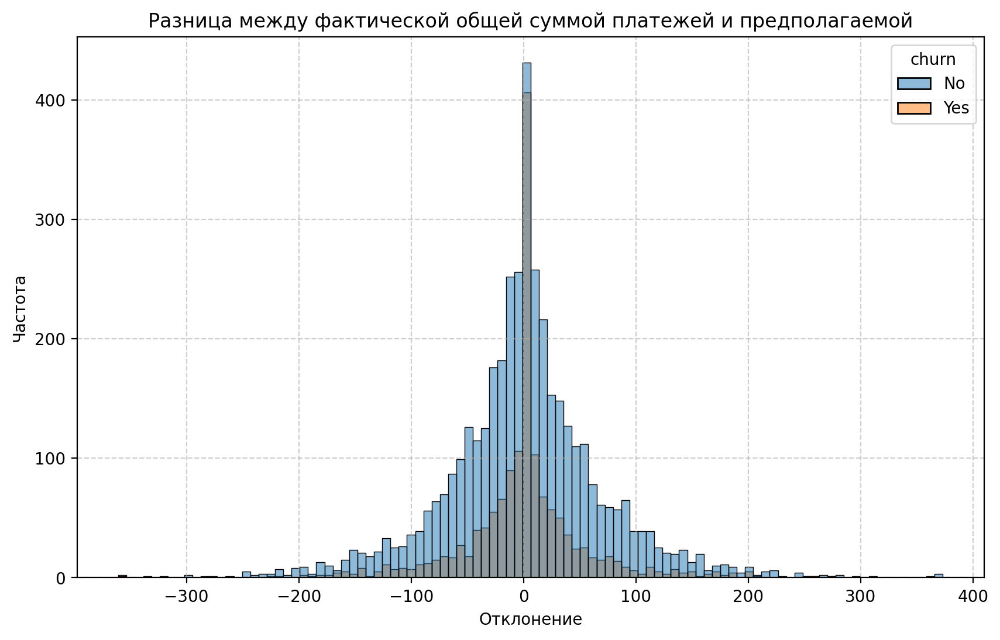

In [54]:
fig, ax = plt.subplots(figsize=(10, 6))

sns.histplot(train_dataset_copy, x="diff", hue="churn", bins=100)

ax.set_xlabel('Отклонение')
ax.set_ylabel('Частота')
ax.set_title('Разница между фактической общей суммой платежей и предполагаемой')
ax.grid(True, linestyle='--', alpha=0.6)

plt.show()

Скорее всего разница связана с изменением тарифного плана клиента в течение времени, который не был учтен в данных.

----

# Итерация 1

## Подготовка данных

In [55]:
X_train_df = train_dataset.drop(["churn"], axis=1)
y_train_df = train_dataset.loc[:, "churn"]

X_val_df = val_dataset.drop(["churn"], axis=1)
y_val_df = val_dataset.loc[:, "churn"]

In [56]:
X_train_df.head(1)

,customer_id,gender,senior_citizen,partner,dependents,tenure,phone_service,multiple_lines,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,contract,paperless_billing,payment_method,monthly_charges,total_charges
24,6322-HRPFA,Male,0,Yes,Yes,49,Yes,No,DSL,Yes,Yes,No,Yes,No,No,Month-to-month,No,Credit card (automatic),59.6,2970.3


In [57]:
cat_features = X_train_df.drop(
    [
        "customer_id",
        "tenure",
        "monthly_charges",
        "total_charges",
    ],
    axis=1
).columns.to_list()

num_features = [
    "tenure",
    "monthly_charges",
    "total_charges"
]

In [58]:
# y_sample необходим для корректного кодирования в label encoder:
# {No: 0, Yes: 1}
y_sample = ['No', 'Yes']

y_label_encoder = LabelEncoder()

full_transformer = ColumnTransformer(
    [
        ("cat", OneHotEncoder(drop="first", sparse_output=False), cat_features),
        ("num", StandardScaler(), num_features)
    ],
    sparse_threshold=0,
    remainder="drop"
).set_output(transform="pandas")

In [59]:
df_X_train = full_transformer.fit_transform(X_train_df)
X_train = df_X_train.to_numpy()
y_label_encoder.fit(y_sample)
y_train = y_label_encoder.transform(y_train_df)
X_train.shape, y_train.shape

((5634, 30), (5634,))

In [60]:
df_X_val = full_transformer.transform(X_val_df)
X_val = df_X_val.to_numpy()
y_val = y_label_encoder.transform(y_val_df)
X_val.shape, y_val.shape

((704, 30), (704,))

## Моделирование

In [61]:
def cross_validate_scoring(models: dict,
                           X: Union[np.array, pd.DataFrame],
                           y: Union[np.array, pd.DataFrame],
                           results: list=None,
                           **kwargs) -> pd.DataFrame:
    """

    Args:
        models (dict): словарь моделей типа: {'ключ': модель}
        X (np.array | pd.DataFrame): X по которому будет строиться модель
        y (np.array | pd.DataFrame): y по которому будет строиться модель

    Returns:
        pd.DataFrame: возвращает датафрейм вида:
        [[ model_name, fit_time,  score_time,  test_metric1, test_metric2, ... ],
         [ model1,     VALUE,     VALUE,       VALUE,        VALUE,        ... ],
         [ model2,     VALUE,     VALUE,       VALUE,        VALUE,        ... ],
         [ ...         ...        ...          ...           ...           ... ],
         [ modelN,     VALUE,     VALUE,       VALUE,        VALUE,        ... ]  ]
         где,
         VALUE - среднее значение метрики
    """
    if not results:
        results = list()

    max_name_length = len(max(list(models.keys()), key=len))

    for name, model in models.items():
        print(f"Current model: {name:<{max_name_length}}", end=" ")
        start_time = time.time()
        scores = cross_validate(model, X, y, **kwargs)
        end_time = time.time()
        total_time = end_time - start_time
        print(f"Cross-validation time: {total_time:.3f}")

        mean_scores = {key: np.mean(value) for key, value in scores.items()}
        mean_scores["model_name"] = name
        results.append(mean_scores)

    score_df = pd.DataFrame(results)
    column_order = ["model_name"] + [col for col in score_df.columns if col != "model_name"]
    return score_df[column_order]

In [62]:
model_dict = {
    # Линейные модели
    "logistic_regression": LogisticRegression(penalty=None, max_iter=1000),
    "lasso_classifier": LogisticRegression(penalty='l1', solver='saga', max_iter=1000),
    "ridge_classifier": RidgeClassifier(),
    "elasticnet_classifier": LogisticRegression(penalty='elasticnet', solver='saga', l1_ratio=0.5, max_iter=1000),

    # Модели, основанные на деревьях
    "decision_tree": DecisionTreeClassifier(),
    "random_forest": RandomForestClassifier(),
    "gradient_boosting": GradientBoostingClassifier(),
    "adaboost": AdaBoostClassifier(),
    "xgboost": XGBClassifier(eval_metric='logloss', max_depth=2, n_estimators=1000),
    "catboost": CatBoostClassifier(silent=True, depth=2, iterations=1000),

    # Метрические модели
    "knn": KNeighborsClassifier(),

    # Вероятностные
    "naive_bayes": GaussianNB(),

    # SVM
    "svm_linear": SVC(kernel='linear', probability=True),

    # Дискриминантный анализ
    "lda": LinearDiscriminantAnalysis(),
    "qda": QuadraticDiscriminantAnalysis()
}

# Тестирование
catboost_dict = {
    "catboost_with_cat_feats": CatBoostClassifier(
        silent=True,
        depth=2,
        iterations=1000,
        cat_features=cat_features),
}

scoring_dict = {
    'accuracy': 'accuracy',
    'precision': 'precision',
    'recall': 'recall',
    'f1': 'f1',
    'roc_auc': 'roc_auc',
    'pr_auc': 'average_precision'
}

color_list = cm.tab20(np.linspace(0, 1, len(model_dict) + 1))

In [63]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    result1 = cross_validate_scoring(
        model_dict,
        X_train,
        y_train,
        cv=StratifiedKFold(n_splits=5, shuffle=True),
        scoring=scoring_dict)

Current model: logistic_regression   Cross-validation time: 0.731
Current model: lasso_classifier      Cross-validation time: 1.642
Current model: ridge_classifier      Cross-validation time: 0.110
Current model: elasticnet_classifier Cross-validation time: 9.337
Current model: decision_tree         Cross-validation time: 0.239
Current model: random_forest         Cross-validation time: 5.372
Current model: gradient_boosting     Cross-validation time: 8.224
Current model: adaboost              Cross-validation time: 1.777
Current model: xgboost               Cross-validation time: 6.261
Current model: catboost              Cross-validation time: 9.966
Current model: knn                   Cross-validation time: 0.435
Current model: naive_bayes           Cross-validation time: 0.089
Current model: svm_linear            Cross-validation time: 20.799
Current model: lda                   Cross-validation time: 0.180
Current model: qda                   Cross-validation time: 0.179


In [64]:
result1.sort_values("test_pr_auc", ascending=False)

,model_name,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1,test_roc_auc,test_pr_auc
9,catboost,1.944934,0.047169,0.806000,0.668178,0.534448,0.593545,0.850478,0.670860
6,gradient_boosting,1.623912,0.019527,0.803338,0.663086,0.531773,0.589709,0.846732,0.666563
1,lasso_classifier,0.293586,0.033523,0.807064,0.662202,0.559866,0.606372,0.848901,0.663073
7,adaboost,0.316518,0.037959,0.803691,0.675904,0.503010,0.576494,0.847682,0.662458
3,elasticnet_classifier,1.844217,0.022092,0.807064,0.661150,0.561204,0.606825,0.848980,0.660714
0,logistic_regression,0.110945,0.031894,0.804932,0.654252,0.563211,0.605185,0.848607,0.660348
12,svm_linear,3.974273,0.184717,0.801737,0.649831,0.547826,0.593986,0.838924,0.653697
2,ridge_classifier,0.007335,0.013743,0.804761,0.668403,0.528428,0.589627,0.840578,0.653490
13,lda,0.018137,0.016349,0.799608,0.639051,0.562542,0.598282,0.841340,0.652700
8,xgboost,1.216247,0.034085,0.785765,0.611982,0.526421,0.565705,0.822721,0.623418


/usr/local/lib/python3.12/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 0 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 1 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(


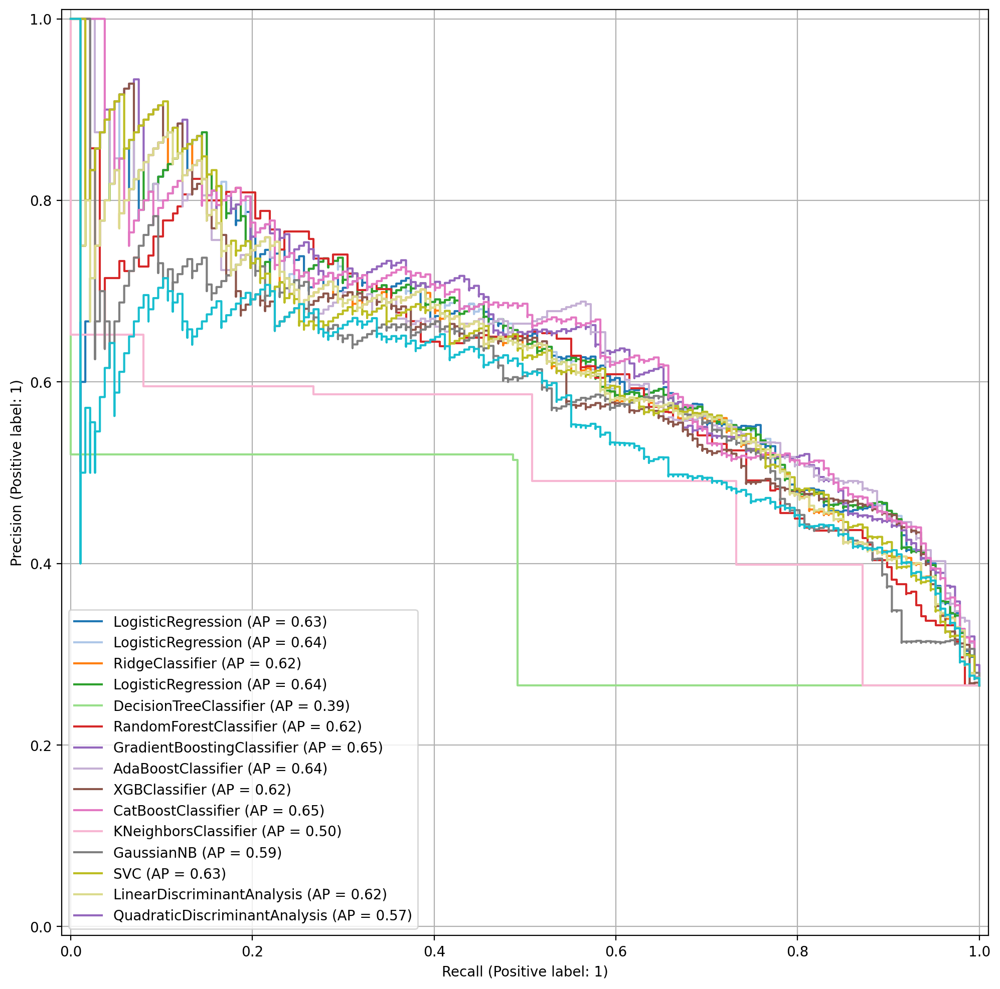

In [65]:
fig, ax = plt.subplots(figsize=(12, 12))

for idx, (name, model) in enumerate(model_dict.items()):

    model.fit(X_train, y_train)
    display = metrics.PrecisionRecallDisplay.from_estimator(
        model,
        X_val,
        y_val,
        ax=ax
    )
    display.line_.set_color(color_list[idx])

plt.grid()
plt.show()

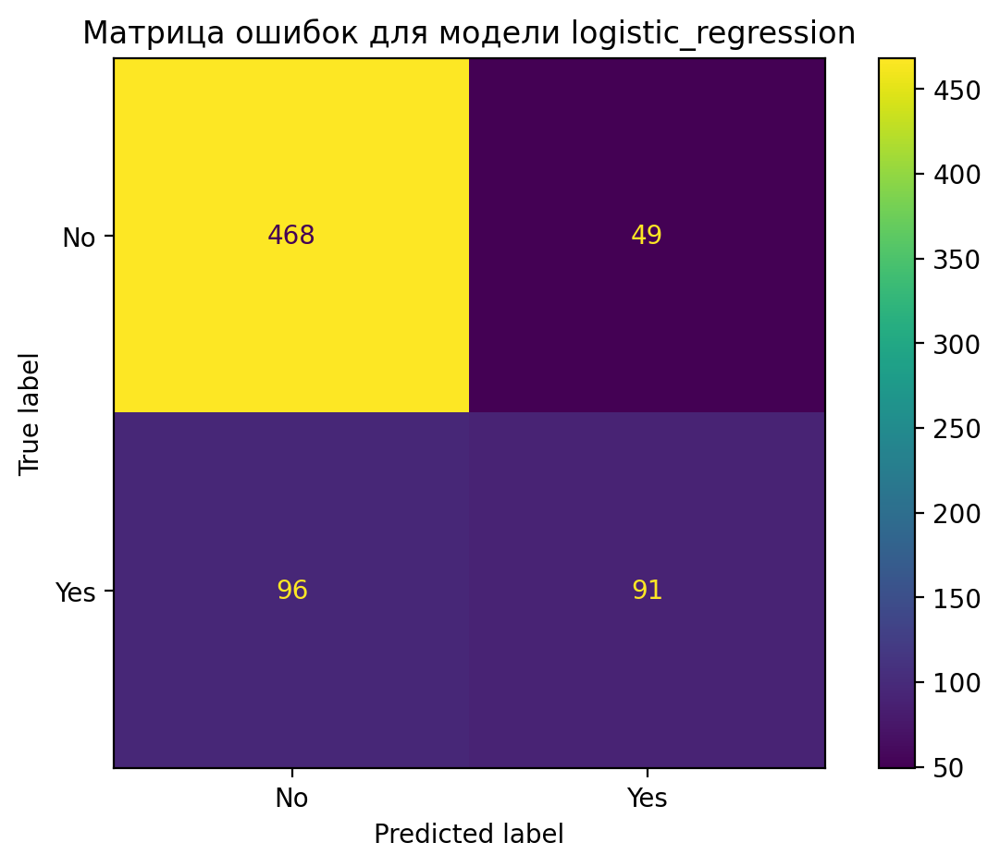

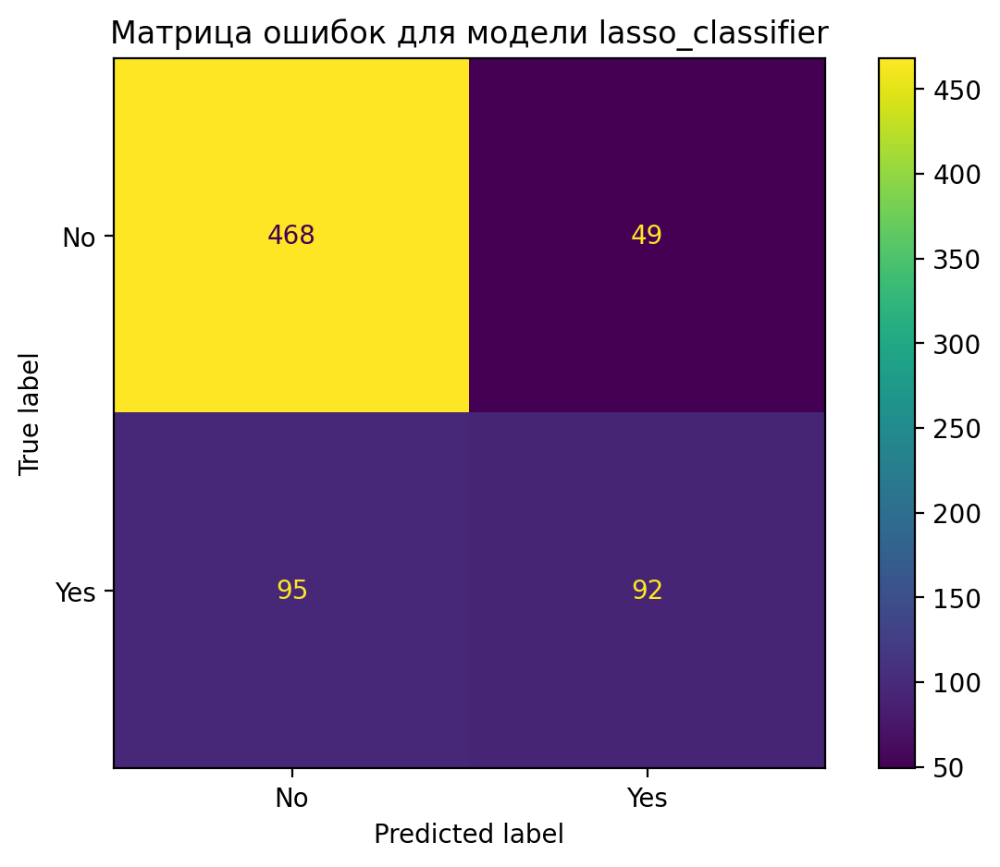

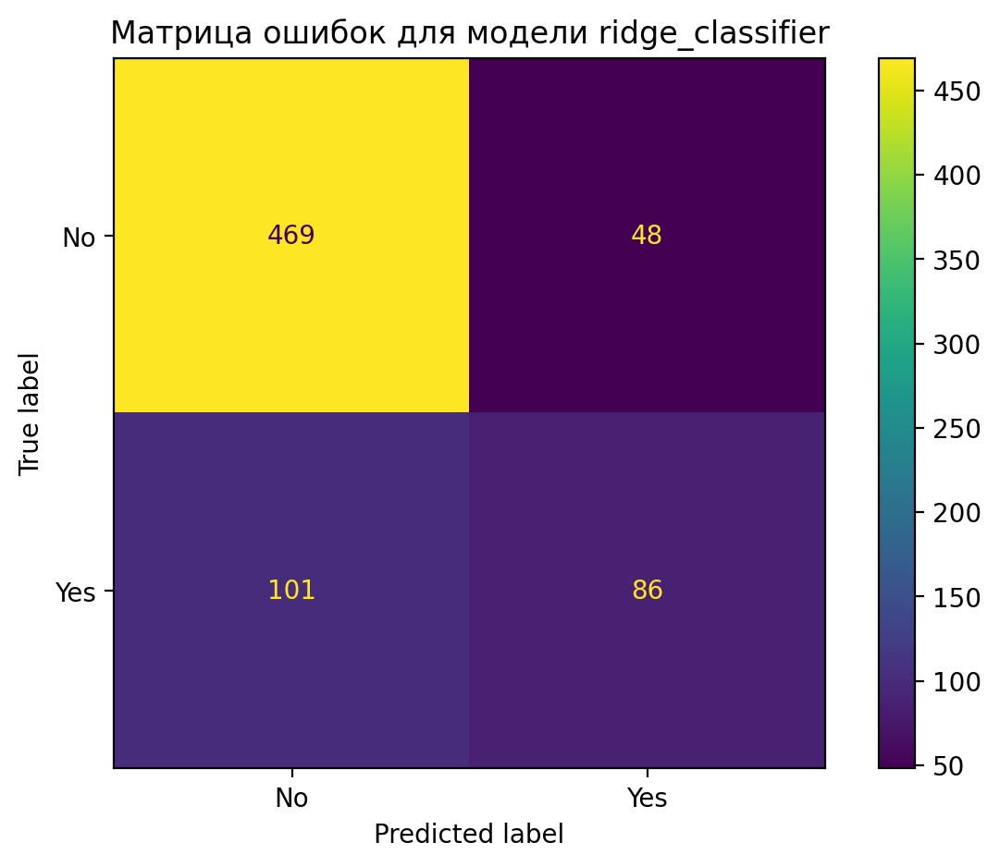

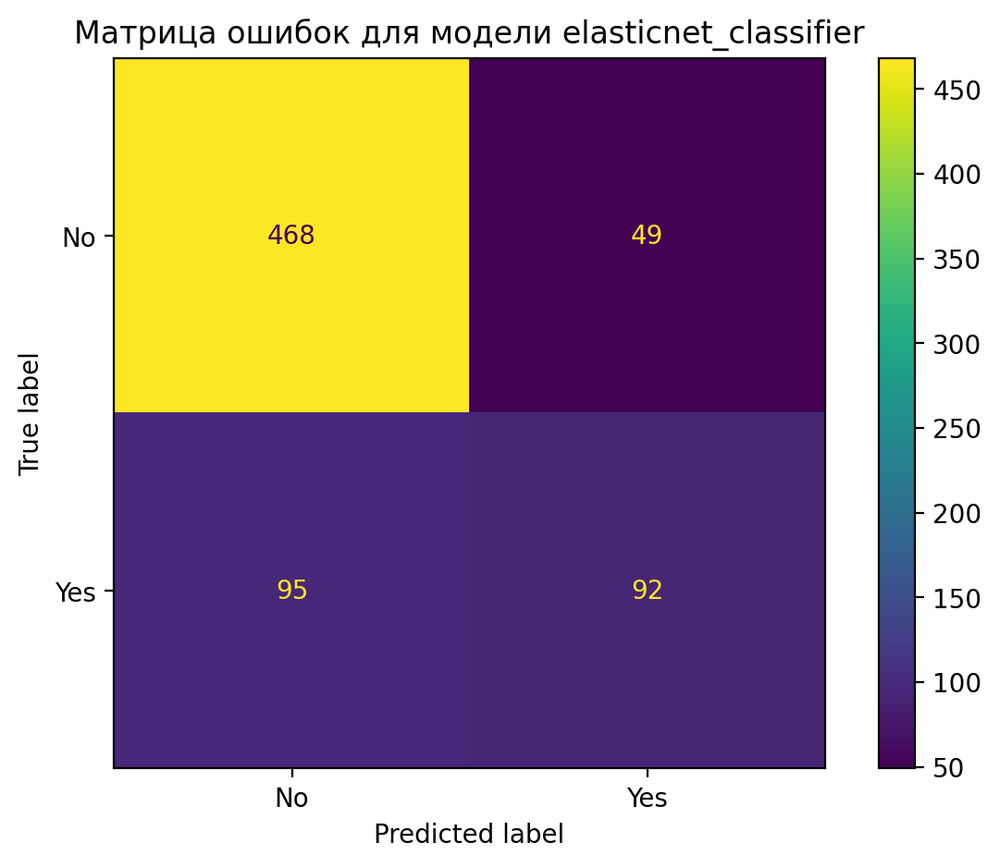

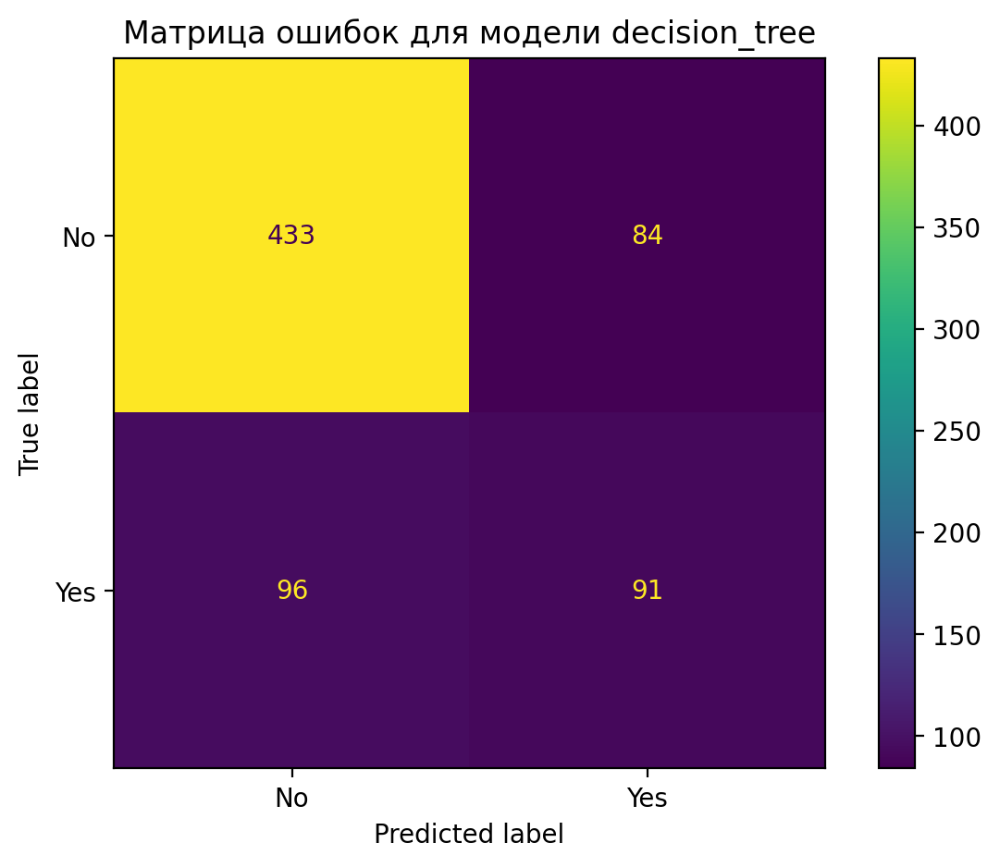

...

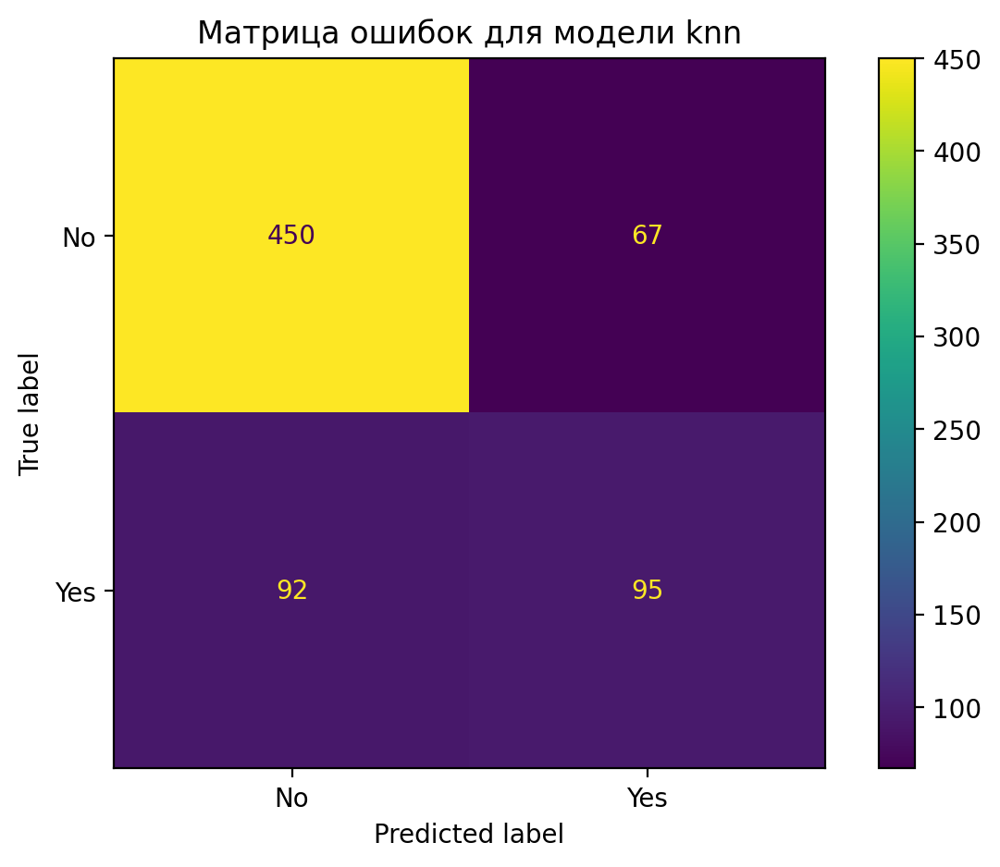

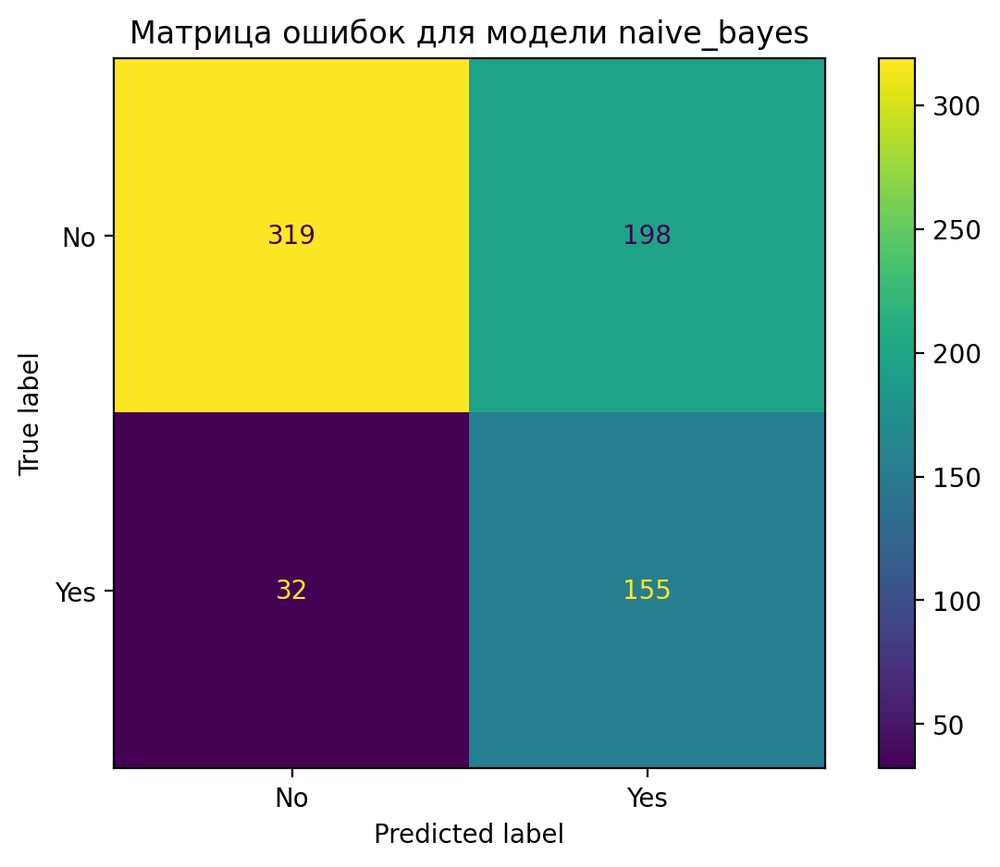

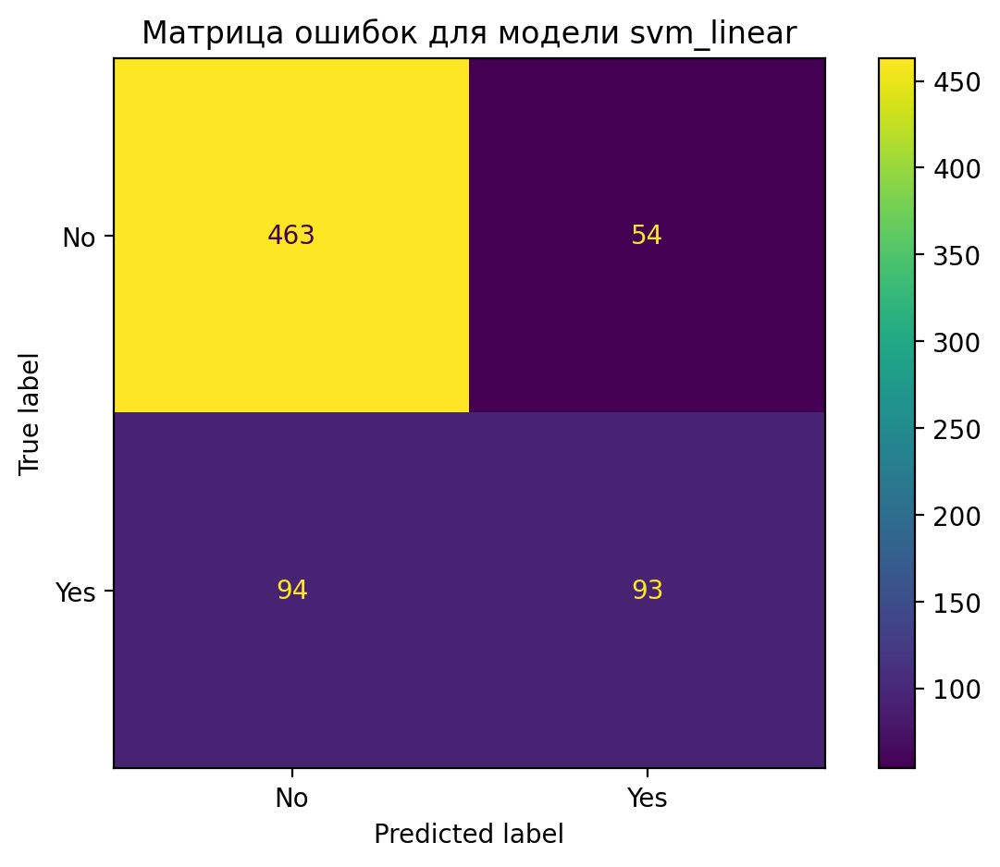

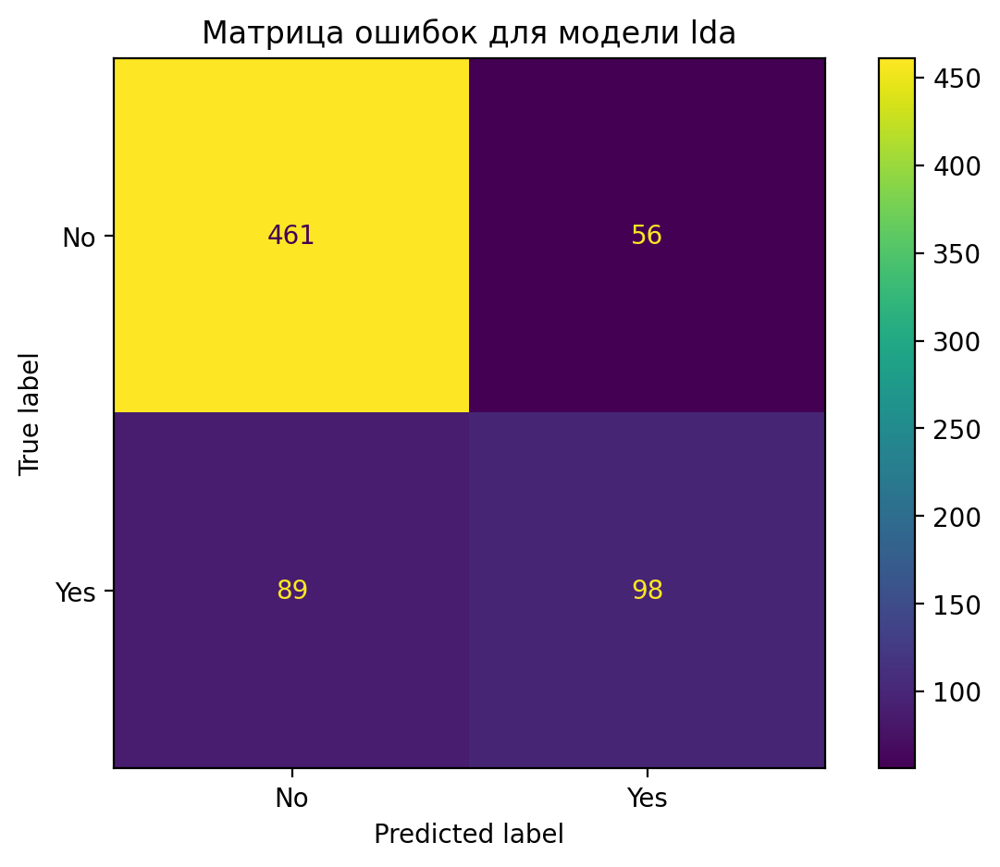

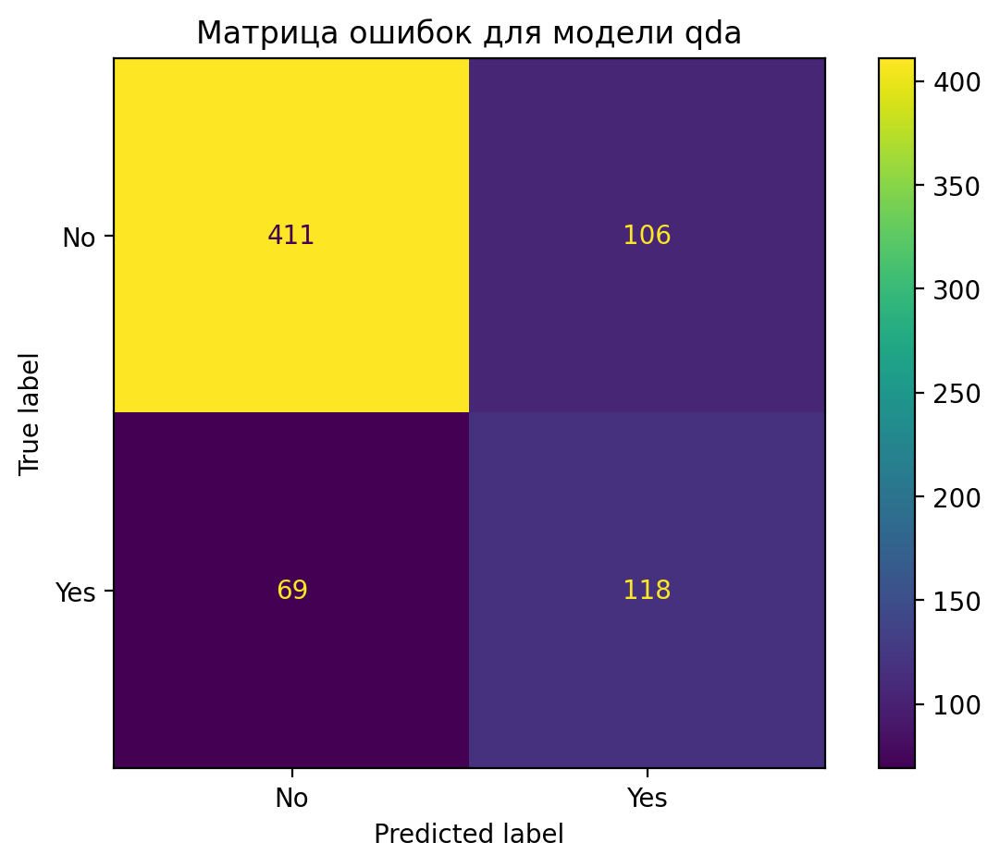

In [66]:
for name, model in model_dict.items():
    fig, ax = plt.subplots()

    metrics.ConfusionMatrixDisplay.from_estimator(
        model,
        X_val,
        y_val,
        display_labels=y_label_encoder.classes_,
        ax=ax
    )

    ax.set_title(f"Матрица ошибок для модели {name}")
    plt.tight_layout()
    plt.show()

In [67]:
for name, model in model_dict.items():
    y_val_pred = model.predict(X_val)

    temp_res = metrics.classification_report(y_val, y_val_pred)
    temp_size = len(max(temp_res.split("\n"), key=len))

    print(f"".center(temp_size, "="))
    print(f" {name} ".center(temp_size, "="))
    print(f"".center(temp_size, "="))
    print(temp_res)
    print()

================ logistic_regression ================
              precision    recall  f1-score   support

           0       0.83      0.91      0.87       517
           1       0.65      0.49      0.56       187

    accuracy                           0.79       704
   macro avg       0.74      0.70      0.71       704
weighted avg       0.78      0.79      0.78       704


================== lasso_classifier =================
              precision    recall  f1-score   support

           0       0.83      0.91      0.87       517
           1       0.65      0.49      0.56       187

    accuracy                           0.80       704
   macro avg       0.74      0.70      0.71       704
weighted avg       0.78      0.80      0.79       704


================== ridge_classifier =================
              precision    recall  f1-score   support

           0       0.82      0.91      0.86       517
           1       0.64      0.46      0.54       187

    accuracy      

In [68]:
permutation_result1 = permutation_importance(
    model_dict[result1.sort_values("test_roc_auc", ascending=False).loc[:5, "model_name"].to_list()[0]],
    X_val,
    y_val,
    scoring=["accuracy", "precision", "recall", "f1", "roc_auc"],
    n_repeats=10)

In [69]:
importance_df1 = pd.DataFrame({
    'feature': df_X_train.columns,
    'importance_mean': permutation_result1["roc_auc"]["importances_mean"],
    'importance_std': permutation_result1["roc_auc"]["importances_std"]
})

importance_df2 = importance_df1.sort_values('importance_mean', ascending=False)
importance_df2

,feature,importance_mean,importance_std
27,num__tenure,0.072179,0.007934
7,cat__internet_service_Fiber optic,0.028449,0.003105
22,cat__contract_Two year,0.021859,0.004898
25,cat__payment_method_Electronic check,0.006848,0.002093
21,cat__contract_One year,0.004203,0.003164
18,cat__streaming_tv_Yes,0.002932,0.000923
28,num__monthly_charges,0.002891,0.001977
10,cat__online_security_Yes,0.002292,0.000932
6,cat__multiple_lines_Yes,0.002139,0.001579
4,cat__phone_service_Yes,0.001164,0.000715


# Итерация 2

## Подготовка данных

In [70]:
class ContractToIntTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.transformation_dict = {
            'Month-to-month': 1,
            'One year': 12,
            'Two year': 24
        }

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X_ = X.copy()
        X_["contract_int"] = X_.loc[:, "contract"].map(self.transformation_dict)
        return X_


class CheckAllServicesTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X_ = X.copy()
        X_['all_services'] = np.where(
            (X_['online_security'] == 'Yes') &
            (X_['online_backup'] == 'Yes') &
            (X_['device_protection'] == 'Yes') &
            (X_['tech_support'] == 'Yes') &
            (X_['streaming_tv'] == 'Yes') &
            (X_['streaming_movies'] == 'Yes'),
            'Yes', 'No'
        )
        return X_


class QuantityOfInternetServicesTransformer(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.columns_to_check = [
            'online_security', 'online_backup', 'device_protection',
            'tech_support', 'streaming_tv', 'streaming_movies'
        ]

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X_ = X.copy()

        X_['internet_service_ratio'] = (X_[self.columns_to_check] == 'Yes').sum(axis=1) / len(self.columns_to_check)
        X_['internet_service_ratio'] = X_['internet_service_ratio'].round(5)
        return X_

In [71]:
train_dataset_copy = train_dataset.copy()

In [72]:
cust_model = ContractToIntTransformer()
train_dataset_copy = cust_model.fit_transform(train_dataset_copy)

In [73]:
train_dataset_copy.head()

,customer_id,gender,senior_citizen,partner,dependents,tenure,phone_service,multiple_lines,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,contract,paperless_billing,payment_method,monthly_charges,total_charges,churn,contract_int
24,6322-HRPFA,Male,0,Yes,Yes,49,Yes,No,DSL,Yes,Yes,No,Yes,No,No,Month-to-month,No,Credit card (automatic),59.60,2970.30,No,1
4391,5778-BVOFB,Female,0,No,No,9,Yes,No,DSL,No,No,No,Yes,Yes,No,Month-to-month,Yes,Bank transfer (automatic),59.50,530.05,No,1
4953,1627-AFWVJ,Female,0,No,No,29,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.40,554.25,No,24
6846,6618-RYATB,Female,0,No,No,1,Yes,Yes,Fiber optic,No,No,Yes,No,No,No,Month-to-month,Yes,Mailed check,79.55,79.55,Yes,1
5940,9711-FJTBX,Male,0,Yes,Yes,56,Yes,No,Fiber optic,No,Yes,Yes,Yes,No,No,One year,Yes,Mailed check,85.85,4793.80,No,12


In [74]:
test_pipe = Pipeline([
    ("contract_to_int", ContractToIntTransformer()),
    ("check_all_services", CheckAllServicesTransformer()),
    ("quantity_of_internet_services", QuantityOfInternetServicesTransformer())
])

train_dataset_copy = test_pipe.fit_transform(train_dataset_copy)
train_dataset_copy.head(3)

,customer_id,gender,senior_citizen,partner,dependents,tenure,phone_service,multiple_lines,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,contract,paperless_billing,payment_method,monthly_charges,total_charges,churn,contract_int,all_services,internet_service_ratio
24,6322-HRPFA,Male,0,Yes,Yes,49,Yes,No,DSL,Yes,Yes,No,Yes,No,No,Month-to-month,No,Credit card (automatic),59.6,2970.30,No,1,No,0.50000
4391,5778-BVOFB,Female,0,No,No,9,Yes,No,DSL,No,No,No,Yes,Yes,No,Month-to-month,Yes,Bank transfer (automatic),59.5,530.05,No,1,No,0.33333
4953,1627-AFWVJ,Female,0,No,No,29,Yes,No,No,No internet service,No internet service,No internet service,No internet service,No internet service,No internet service,Two year,No,Mailed check,19.4,554.25,No,24,No,0.00000


In [75]:
X_train_df = train_dataset.drop(["churn"], axis=1)
y_train_df = train_dataset.loc[:, "churn"]

X_val_df = val_dataset.drop(["churn"], axis=1)
y_val_df = val_dataset.loc[:, "churn"]

In [76]:
cat_features = X_train_df.drop(
    [
        "customer_id",
        "tenure",
        "monthly_charges",
        "total_charges"
    ],
    axis=1
).columns.to_list() + ["all_services"]

num_features = [
    "tenure",
    "monthly_charges",
    "total_charges",
    "internet_service_ratio",
    "contract_int"
]

In [77]:
y_sample = ['No', 'Yes']

y_label_encoder = LabelEncoder()

full_transformer = ColumnTransformer(
    [
        ("cat", OneHotEncoder(drop="first", sparse_output=False), cat_features),
        ("num", StandardScaler(), num_features)
    ],
    sparse_threshold=0,
    remainder="drop"
).set_output(transform="pandas")

pipe = Pipeline([
    ("contract_to_int", ContractToIntTransformer()),
    ("check_all_services", CheckAllServicesTransformer()),
    ("quantity_of_internet_services", QuantityOfInternetServicesTransformer()),
    ("column_transformer", full_transformer)
])

In [78]:
df_X_train = pipe.fit_transform(X_train_df)
X_train = df_X_train.to_numpy()
y_label_encoder.fit(y_sample)
y_train = y_label_encoder.transform(y_train_df)
X_train.shape, y_train.shape

((5634, 33), (5634,))

In [79]:
df_X_val = pipe.transform(X_val_df)
X_val = df_X_val.to_numpy()
y_val = y_label_encoder.transform(y_val_df)
X_val.shape, y_val.shape

((704, 33), (704,))

## Моделирование

In [80]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    result2 = cross_validate_scoring(
        model_dict,
        X_train,
        y_train,
        cv=StratifiedKFold(n_splits=5, shuffle=True),
        scoring=scoring_dict)

Current model: logistic_regression   Cross-validation time: 0.330
Current model: lasso_classifier      Cross-validation time: 4.794
Current model: ridge_classifier      Cross-validation time: 0.114
Current model: elasticnet_classifier Cross-validation time: 5.448
Current model: decision_tree         Cross-validation time: 0.274
Current model: random_forest         Cross-validation time: 4.672
Current model: gradient_boosting     Cross-validation time: 6.665
Current model: adaboost              Cross-validation time: 1.879
Current model: xgboost               Cross-validation time: 4.884
Current model: catboost              Cross-validation time: 10.158
Current model: knn                   Cross-validation time: 0.419
Current model: naive_bayes           Cross-validation time: 0.082
Current model: svm_linear            Cross-validation time: 17.253
Current model: lda                   Cross-validation time: 0.190
Current model: qda                   Cross-validation time: 0.243


In [81]:
result2.sort_values("test_pr_auc", ascending=False)

,model_name,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1,test_roc_auc,test_pr_auc
9,catboost,1.982073,0.048394,0.806354,0.669396,0.533110,0.593364,0.850474,0.673124
1,lasso_classifier,0.942667,0.014990,0.806887,0.660911,0.560535,0.606380,0.848197,0.663616
6,gradient_boosting,1.313847,0.017984,0.799255,0.646839,0.539799,0.587871,0.845173,0.661615
3,elasticnet_classifier,1.077429,0.011201,0.805467,0.656661,0.560535,0.604492,0.848171,0.660847
0,logistic_regression,0.050371,0.014311,0.807594,0.660019,0.566555,0.609639,0.848718,0.659359
7,adaboost,0.335627,0.039204,0.800495,0.654362,0.526421,0.583156,0.848459,0.654480
2,ridge_classifier,0.007019,0.014729,0.805291,0.669819,0.528428,0.590040,0.840668,0.653757
12,svm_linear,3.315051,0.134674,0.803869,0.657871,0.542475,0.594341,0.837152,0.652179
13,lda,0.020276,0.016663,0.802450,0.645075,0.567893,0.603956,0.840200,0.651439
11,naive_bayes,0.003941,0.011664,0.669158,0.438478,0.873579,0.583787,0.824445,0.621208


/usr/local/lib/python3.12/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 0 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 1 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(


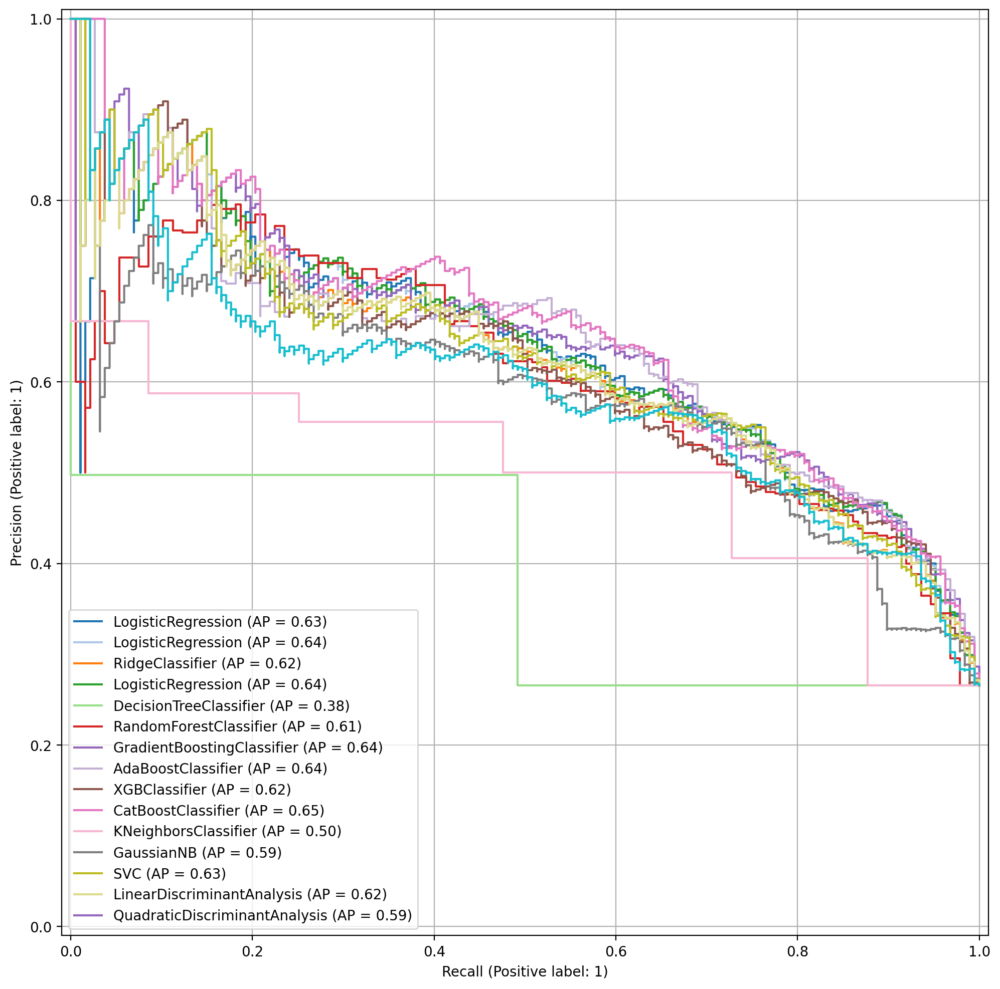

In [82]:
fig, ax = plt.subplots(figsize=(12, 12))

for idx, (name, model) in enumerate(model_dict.items()):

    model.fit(X_train, y_train)
    display = metrics.PrecisionRecallDisplay.from_estimator(
        model,
        X_val,
        y_val,
        ax=ax
    )
    display.line_.set_color(color_list[idx])

plt.grid()
plt.show()

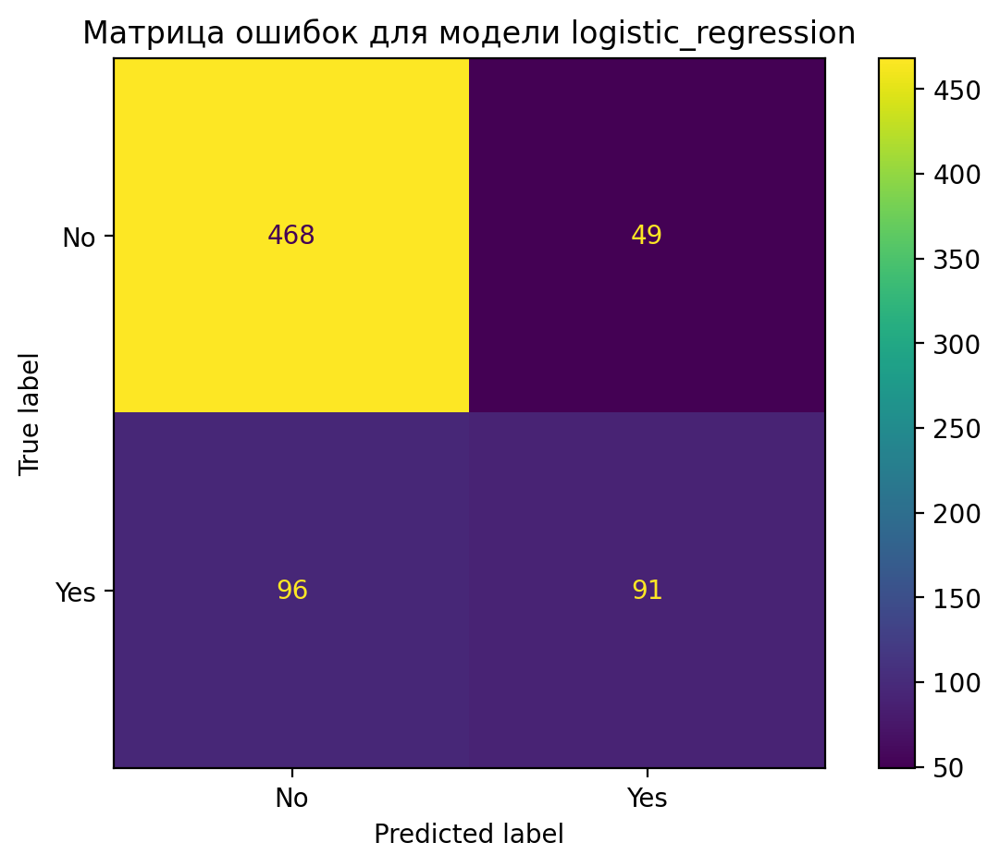

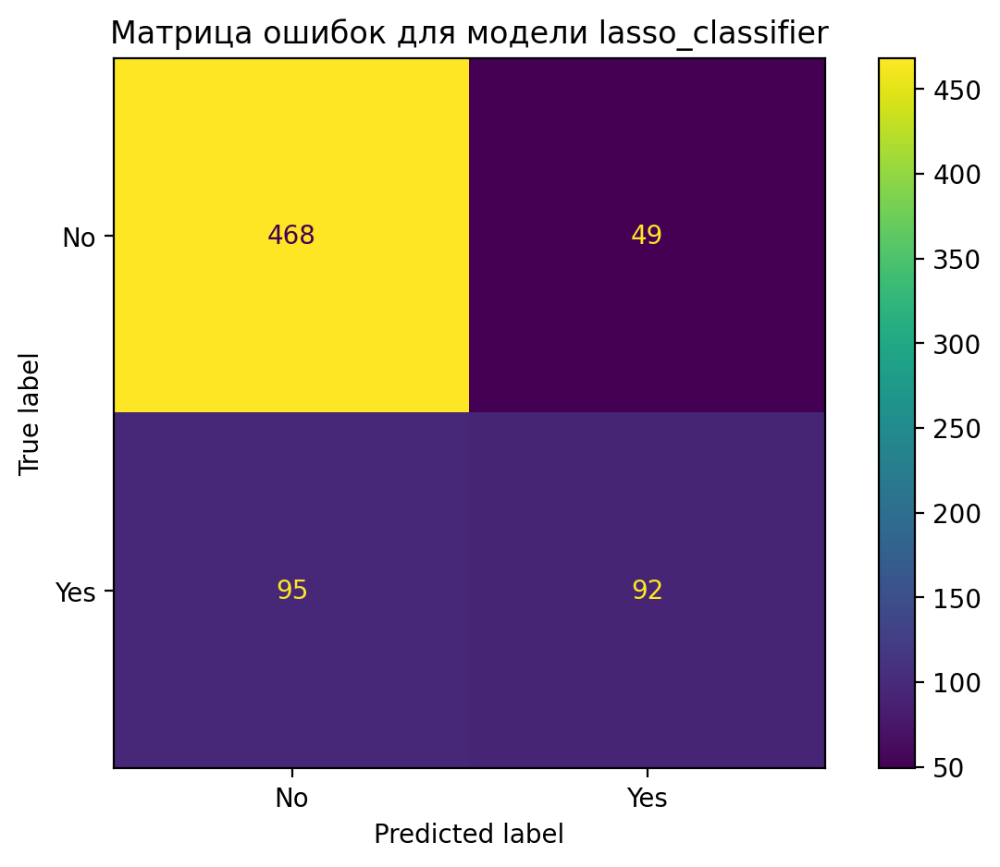

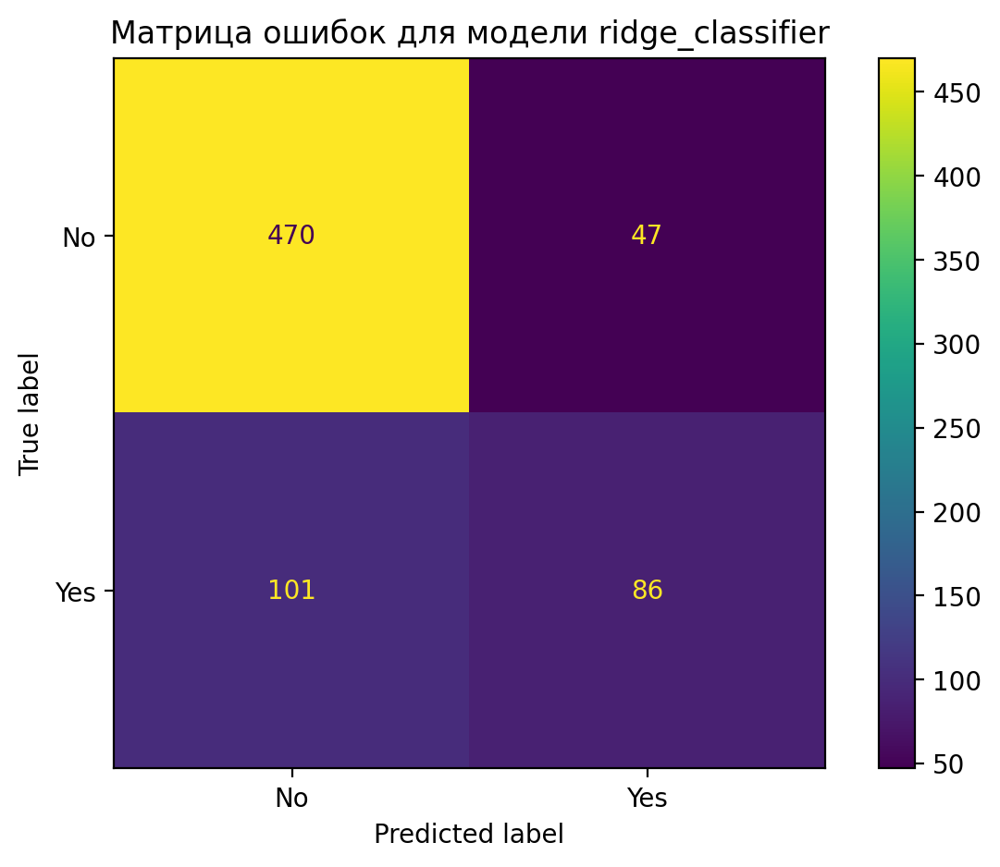

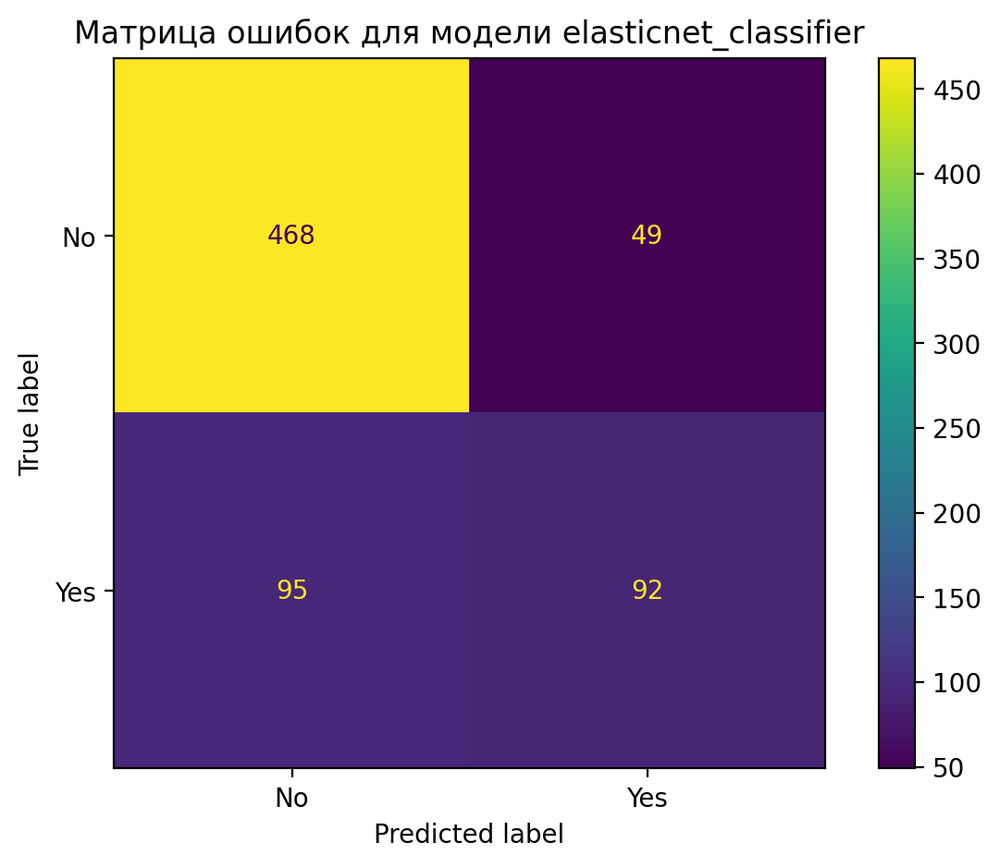

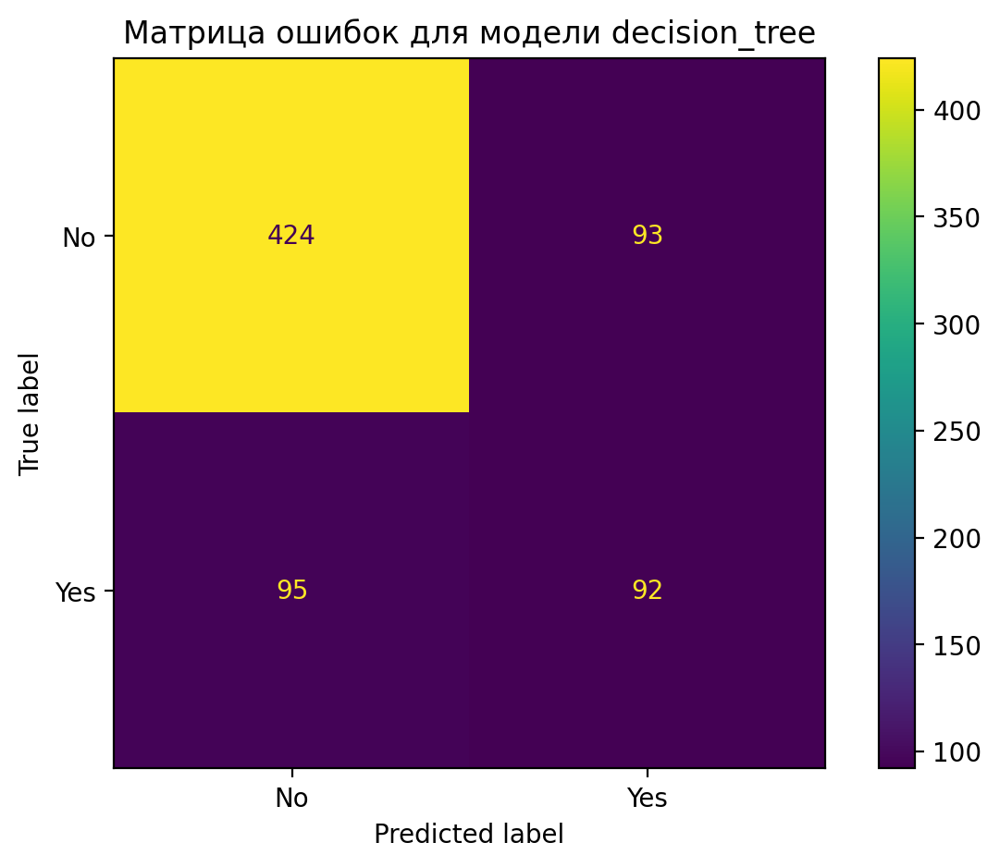

...

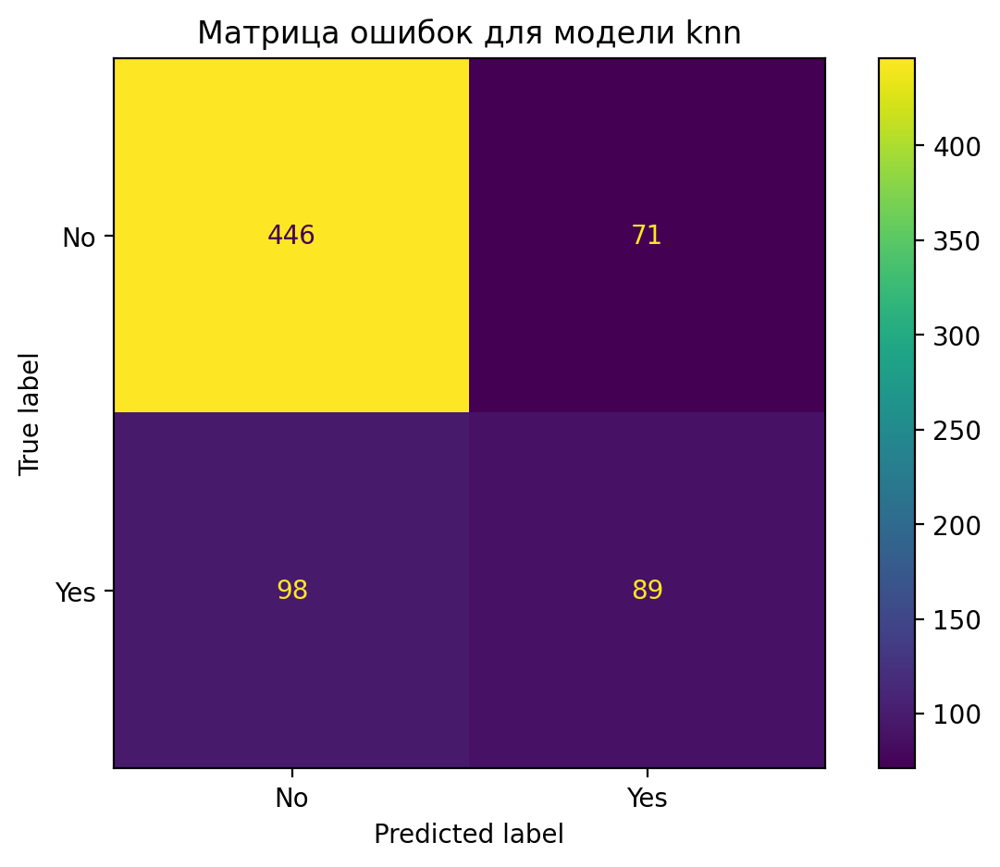

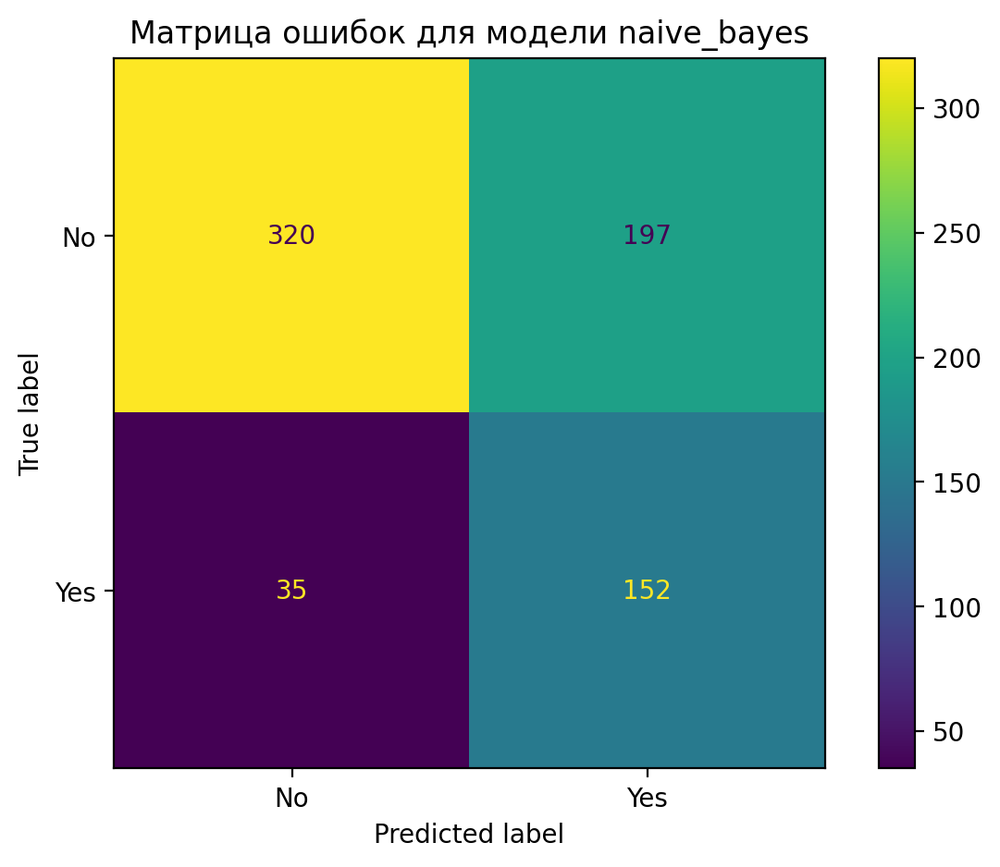

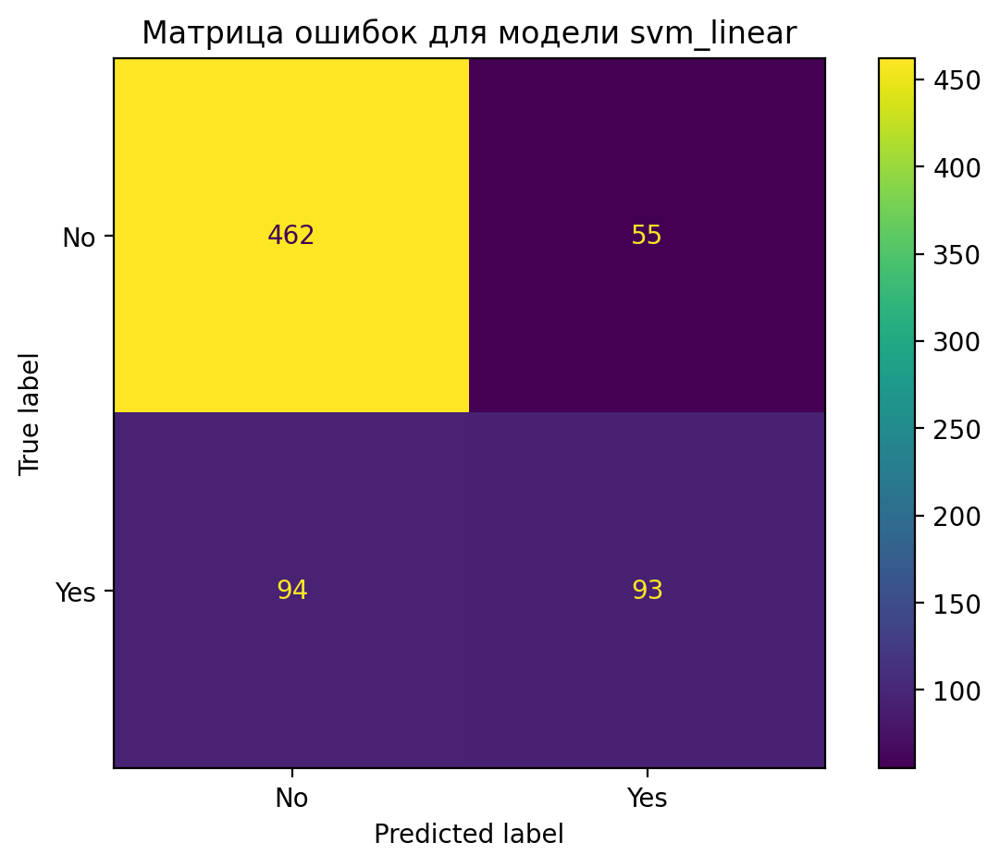

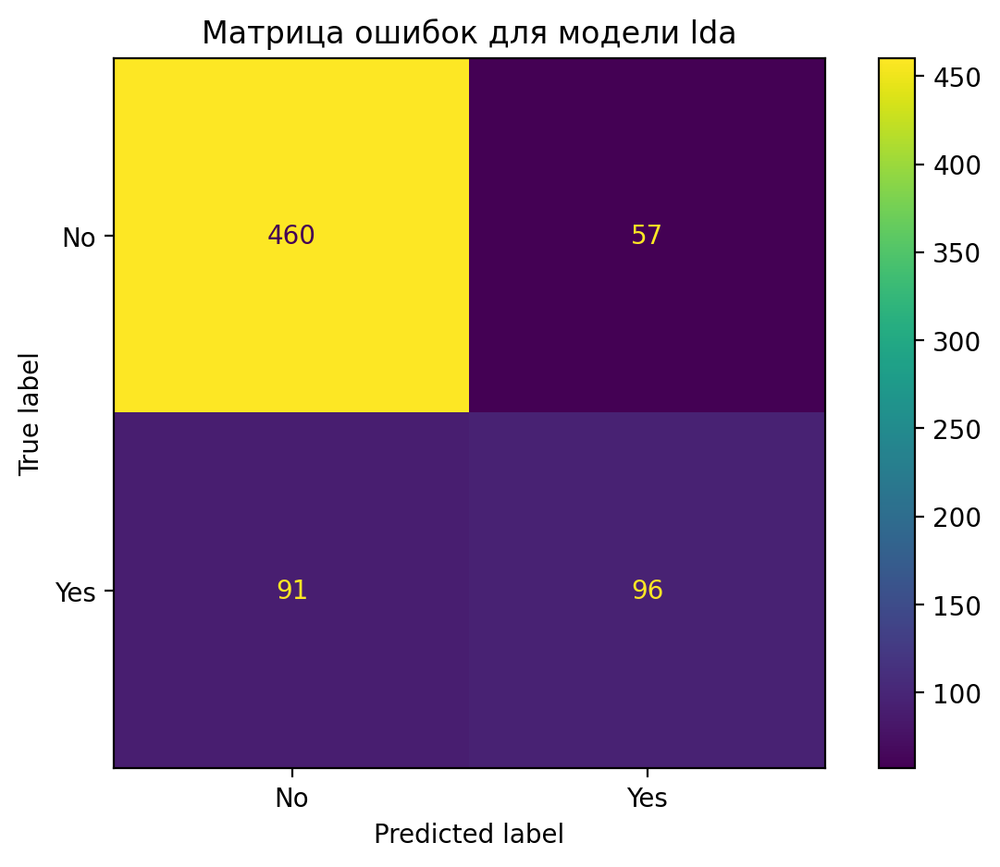

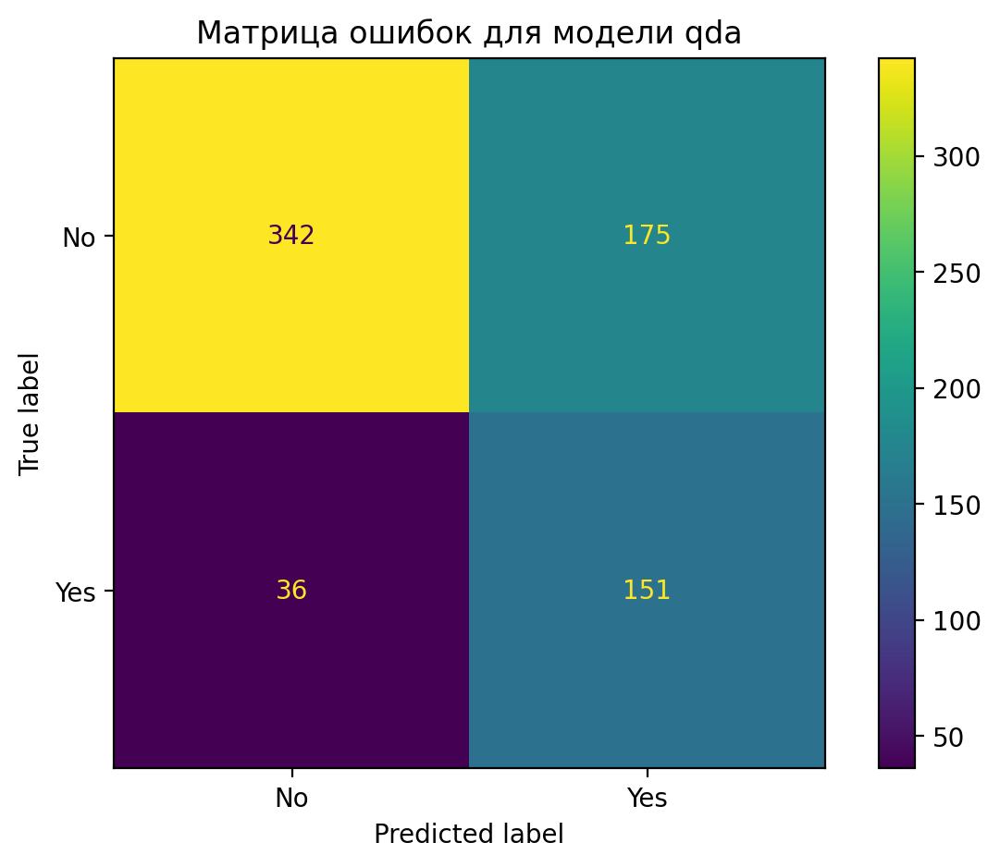

In [83]:
for name, model in model_dict.items():
    fig, ax = plt.subplots()

    metrics.ConfusionMatrixDisplay.from_estimator(
        model,
        X_val,
        y_val,
        display_labels=y_label_encoder.classes_,
        ax=ax
    )
    ax.set_title(f"Матрица ошибок для модели {name}")
    plt.tight_layout()
    plt.show()

In [84]:
for name, model in model_dict.items():
    y_val_pred = model.predict(X_val)

    temp_res = metrics.classification_report(y_val, y_val_pred)
    temp_size = len(max(temp_res.split("\n"), key=len))

    print(f"".center(temp_size, "="))
    print(f" {name} ".center(temp_size, "="))
    print(f"".center(temp_size, "="))
    print(temp_res)
    print()

================ logistic_regression ================
              precision    recall  f1-score   support

           0       0.83      0.91      0.87       517
           1       0.65      0.49      0.56       187

    accuracy                           0.79       704
   macro avg       0.74      0.70      0.71       704
weighted avg       0.78      0.79      0.78       704


================== lasso_classifier =================
              precision    recall  f1-score   support

           0       0.83      0.91      0.87       517
           1       0.65      0.49      0.56       187

    accuracy                           0.80       704
   macro avg       0.74      0.70      0.71       704
weighted avg       0.78      0.80      0.79       704


================== ridge_classifier =================
              precision    recall  f1-score   support

           0       0.82      0.91      0.86       517
           1       0.65      0.46      0.54       187

    accuracy      

In [85]:
permutation_result2 = permutation_importance(
    model_dict[result2.sort_values("test_roc_auc", ascending=False).loc[:5, "model_name"].to_list()[0]],
    X_val,
    y_val,
    scoring=["accuracy", "precision", "recall", "f1", "roc_auc"],
    n_repeats=10)

In [86]:
importance_df2 = pd.DataFrame({
    'feature': df_X_train.columns,
    'importance_mean': permutation_result2["roc_auc"]["importances_mean"],
    'importance_std': permutation_result2["roc_auc"]["importances_std"]
})

importance_df2 = importance_df2.sort_values('importance_mean', ascending=False)
importance_df2

,feature,importance_mean,importance_std
28,num__tenure,0.045960,0.006297
32,num__contract_int,0.040929,0.008176
7,cat__internet_service_Fiber optic,0.023053,0.002532
29,num__monthly_charges,0.006435,0.002672
25,cat__payment_method_Electronic check,0.005100,0.001989
18,cat__streaming_tv_Yes,0.002706,0.000899
6,cat__multiple_lines_Yes,0.001706,0.001334
20,cat__streaming_movies_Yes,0.001649,0.000958
10,cat__online_security_Yes,0.001427,0.001789
16,cat__tech_support_Yes,0.001004,0.001320


# Итерация 3

## Подготовка данных

In [87]:
out_features = [
    "tenure",
    "contract_int",
    "internet_service",
    "total_charges",
    "monthly_charges",
    "internet_service",
    "paperless_billing",
    "payment_method",
    "online_security",
    "streaming_movies",
    "tech_support",
    "contract",
    "multiple_lines",
    "phone_service"
]

out_features = set(out_features)
out_features_list = list(out_features)
out_cat_features = set(cat_features) & out_features
out_cat_features = list(out_cat_features)
out_num_features = set(num_features) & out_features
out_num_features = list(out_num_features)

In [88]:
X_train_df = train_dataset.drop(["churn"], axis=1)
y_train_df = train_dataset.loc[:, "churn"]

X_val_df = val_dataset.drop(["churn"], axis=1)
y_val_df = val_dataset.loc[:, "churn"]

In [89]:
y_sample = ['No', 'Yes']

y_label_encoder = LabelEncoder()

full_transformer = ColumnTransformer(
    [
        ("cat", OneHotEncoder(drop="first", sparse_output=False), out_cat_features),
        ("num", StandardScaler(), out_num_features)
    ],
    sparse_threshold=0,
    remainder="drop"
).set_output(transform="pandas")

pipe = Pipeline([
    ("contract_to_int", ContractToIntTransformer()),
    ("check_all_services", CheckAllServicesTransformer()),
    ("quantity_of_internet_services", QuantityOfInternetServicesTransformer()),
    ("column_transformer", full_transformer)
])

In [90]:
df_X_train = pipe.fit_transform(X_train_df)
X_train = df_X_train.to_numpy()
y_label_encoder.fit(y_sample)
y_train = y_label_encoder.transform(y_train_df)
X_train.shape, y_train.shape

((5634, 21), (5634,))

In [91]:
df_X_val = pipe.transform(X_val_df)
X_val = df_X_val.to_numpy()
y_val = y_label_encoder.transform(y_val_df)
X_val.shape, y_val.shape

((704, 21), (704,))

## Моделирование

In [92]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    result3 = cross_validate_scoring(
        model_dict,
        X_train,
        y_train,
        cv=StratifiedKFold(n_splits=5, shuffle=True),
        scoring=scoring_dict)

Current model: logistic_regression   Cross-validation time: 0.241
Current model: lasso_classifier      Cross-validation time: 0.394
Current model: ridge_classifier      Cross-validation time: 0.113
Current model: elasticnet_classifier Cross-validation time: 2.831
Current model: decision_tree         Cross-validation time: 0.313
Current model: random_forest         Cross-validation time: 4.875
Current model: gradient_boosting     Cross-validation time: 5.893
Current model: adaboost              Cross-validation time: 1.767
Current model: xgboost               Cross-validation time: 4.799
Current model: catboost              Cross-validation time: 11.477
Current model: knn                   Cross-validation time: 0.446
Current model: naive_bayes           Cross-validation time: 0.089
Current model: svm_linear            Cross-validation time: 14.408
Current model: lda                   Cross-validation time: 0.127
Current model: qda                   Cross-validation time: 0.147


In [93]:
result3.sort_values("test_pr_auc", ascending=False)

,model_name,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1,test_roc_auc,test_pr_auc
9,catboost,2.253135,0.040963,0.802093,0.659998,0.523746,0.583918,0.850230,0.671697
1,lasso_classifier,0.065776,0.012033,0.804934,0.658110,0.552508,0.598825,0.849282,0.669342
3,elasticnet_classifier,0.553059,0.012148,0.804223,0.656025,0.552508,0.599619,0.849285,0.667737
0,logistic_regression,0.030014,0.016799,0.805288,0.658221,0.554515,0.601546,0.848211,0.666767
6,gradient_boosting,1.160671,0.016904,0.802095,0.654655,0.539130,0.591059,0.845733,0.660361
12,svm_linear,2.705167,0.175458,0.801558,0.656681,0.535117,0.588501,0.837934,0.658800
2,ridge_classifier,0.006393,0.015088,0.804223,0.666995,0.524415,0.586927,0.840618,0.658402
13,lda,0.010216,0.014188,0.799430,0.641396,0.556522,0.595330,0.840261,0.656743
7,adaboost,0.312310,0.040144,0.803693,0.660148,0.535117,0.590791,0.846234,0.651881
11,naive_bayes,0.003785,0.013149,0.697904,0.462196,0.843478,0.597109,0.831412,0.641198


/usr/local/lib/python3.12/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 0 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 1 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(


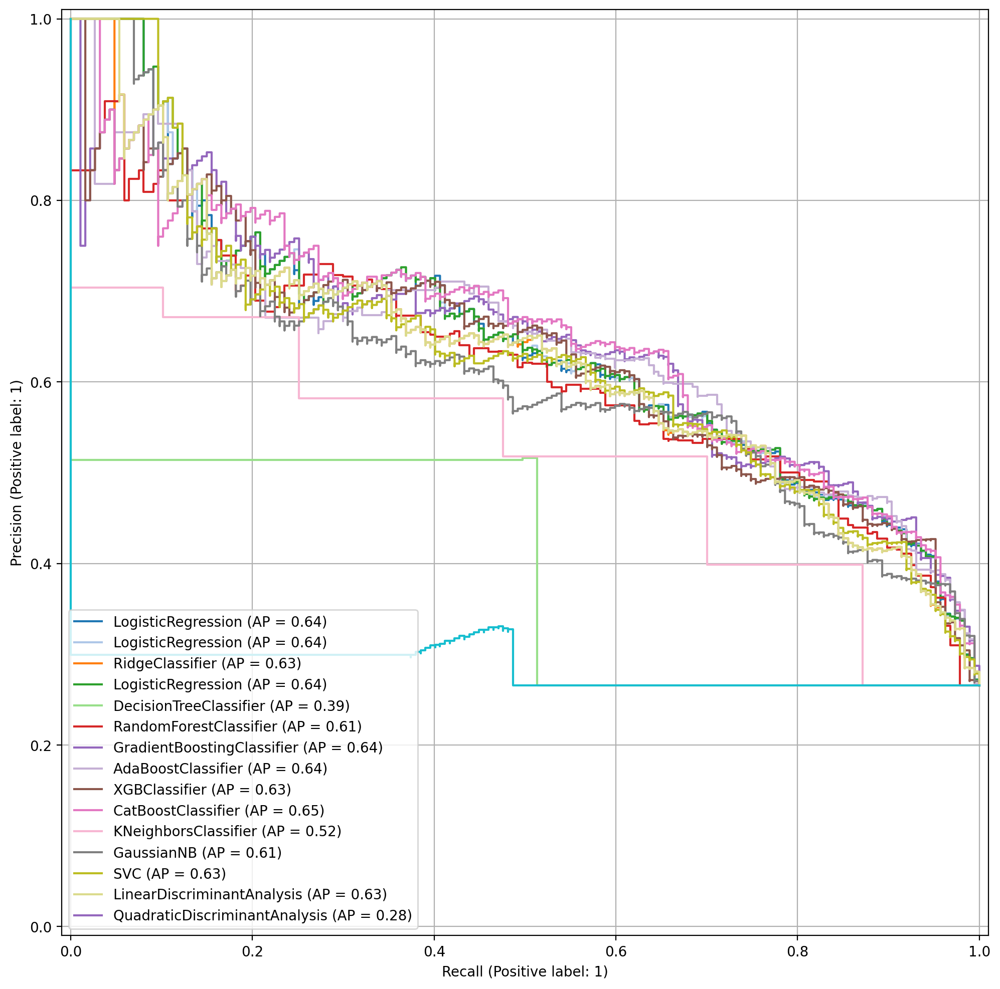

In [94]:
fig, ax = plt.subplots(figsize=(12, 12))

for idx, (name, model) in enumerate(model_dict.items()):

    model.fit(X_train, y_train)
    display = metrics.PrecisionRecallDisplay.from_estimator(
        model,
        X_val,
        y_val,
        ax=ax
    )
    display.line_.set_color(color_list[idx])

plt.grid()
plt.show()

## Подбор гиперпараметров

In [104]:
class PassThroughTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return X[self.columns]

    def set_output(self, transform=None):
        return self

In [105]:
catboost_pipe = Pipeline([
            ("contract_to_int", ContractToIntTransformer()),
            ("check_all_services", CheckAllServicesTransformer()),
            ("quantity_of_internet_services", QuantityOfInternetServicesTransformer()),
            ("passthrough", PassThroughTransformer(out_features_list))
        ])

X_train_norm = X_train.copy()
X_val_norm = X_val.copy()
X_train_catboost = catboost_pipe.fit_transform(X_train_df)
X_val_catboost = catboost_pipe.transform(X_val_df)

/usr/local/lib/python3.12/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


In [106]:
def catboost_objective(trial):
    start_time = time.time()

    preprocess = trial.suggest_categorical("preprocess", [True, False])
    params = {
        "iterations": trial.suggest_int("iterations", 50, 1000, step=50),
        "learning_rate": trial.suggest_float("learning_rate", 1e-5, 1e-1, log=True),
        "depth": trial.suggest_int("depth", 1, 10),
        "l2_leaf_reg": trial.suggest_float('l2_leaf_reg', 1e-3, 10.0, log=True),
        "verbose": False
    }


    if preprocess:
        X_train_preprocessed = X_train_norm
        X_val_processed = X_val_norm
    else:
        params["cat_features"] = out_cat_features

        X_train_preprocessed = X_train_catboost
        X_val_processed = X_val_catboost

    model = CatBoostClassifier(**params)
    model.fit(
            X_train_preprocessed, y_train,
            verbose=False
        )

    y_pred_proba = model.predict_proba(X_val_processed)[:, 1]
    # pr auc
    avg_precision = metrics.average_precision_score(y_val, y_pred_proba)

    duration = time.time() - start_time

    return avg_precision

In [109]:
study = optuna.create_study(direction='maximize')
study.optimize(catboost_objective, n_trials=300, timeout=3600)

[I 2025-08-30 14:16:03,586] A new study created in memory with name: no-name-aae35943-11f1-4f1c-a5bf-376c504efd41
[I 2025-08-30 14:16:16,898] Trial 0 finished with value: 0.6420470582179155 and parameters: {'preprocess': True, 'iterations': 600, 'learning_rate': 0.003827283701598615, 'depth': 9, 'l2_leaf_reg': 1.2037923944932893}. Best is trial 0 with value: 0.6420470582179155.
[I 2025-08-30 14:16:49,548] Trial 1 finished with value: 0.6289900959572927 and parameters: {'preprocess': False, 'iterations': 1000, 'learning_rate': 0.05304715743855803, 'depth': 8, 'l2_leaf_reg': 2.507102667716296}. Best is trial 0 with value: 0.6420470582179155.
[I 2025-08-30 14:16:54,588] Trial 2 finished with value: 0.616493629893726 and parameters: {'preprocess': False, 'iterations': 250, 'learning_rate': 1.0970011565829423e-05, 'depth': 5, 'l2_leaf_reg': 0.0018655925763364355}. Best is trial 0 with value: 0.6420470582179155.
[I 2025-08-30 14:17:16,381] Trial 3 finished with value: 0.6298158643256017 and 

In [111]:
trials_df = study.trials_dataframe()
trials_df.to_csv('optuna_trials.csv', index=False)

best_trial_info = {
    'best_value': study.best_value,
    'best_params': study.best_params,
    'best_trial_number': study.best_trial.number
}

import json
with open('best_trial.json', 'w') as f:
    json.dump(best_trial_info, f, indent=4)

In [112]:
best_params = study.best_params

preprocess = best_params.pop("preprocess")

if preprocess:
    X_train_catboost = X_train.copy()
    X_val_catboost = X_val.copy()
else:
    best_params["cat_features"] = out_cat_features
    X_train_catboost = catboost_pipe.fit_transform(X_train_df)
    X_val_catboost = catboost_pipe.transform(X_val_df)


best_catboost_model = CatBoostClassifier(**best_params)
best_catboost_model.fit(X_train_catboost, y_train, verbose=False)

/usr/local/lib/python3.12/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


/usr/local/lib/python3.12/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 0 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 1 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(


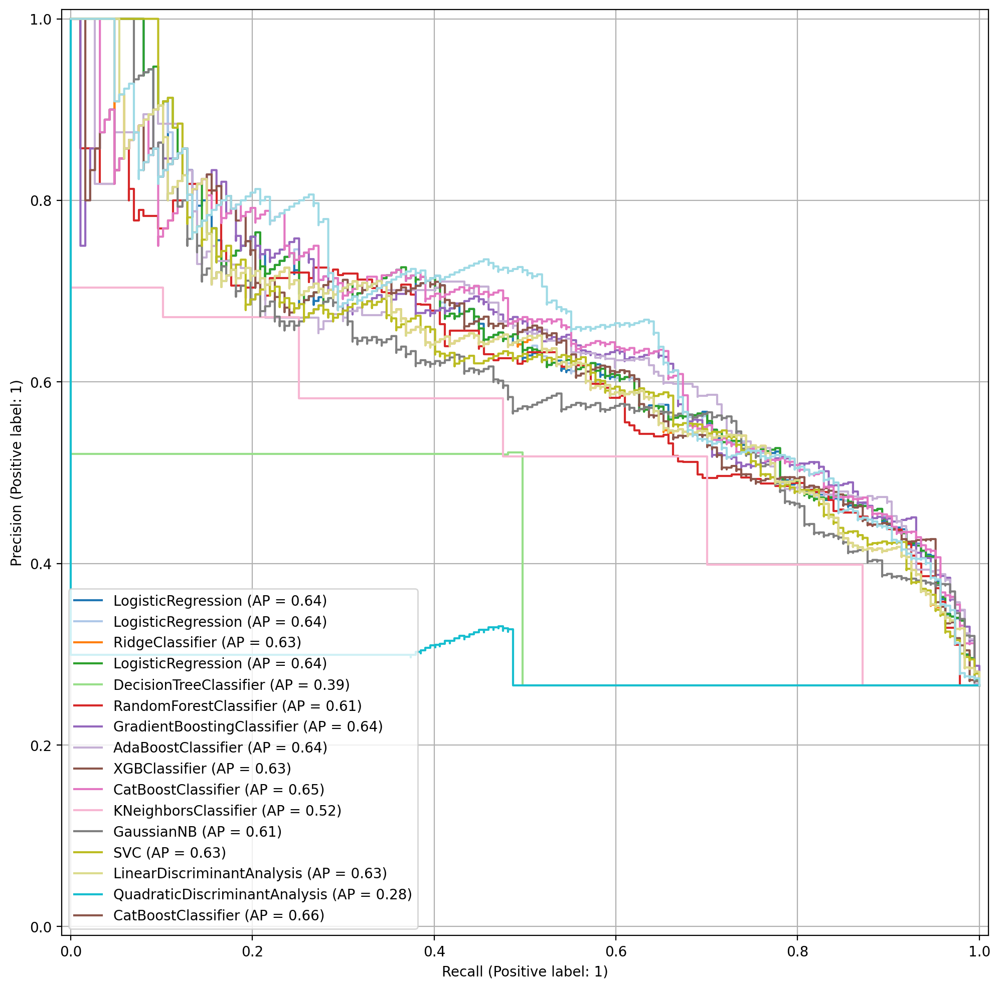

In [113]:
fig, ax = plt.subplots(figsize=(12, 12))

for idx, (name, model) in enumerate(model_dict.items()):

    model.fit(X_train, y_train)
    display = metrics.PrecisionRecallDisplay.from_estimator(
        model,
        X_val,
        y_val,
        ax=ax
    )
    display.line_.set_color(color_list[idx])

display = metrics.PrecisionRecallDisplay.from_estimator(
    best_catboost_model,
    X_val_catboost,
    y_val,
    ax=ax
)
display.line_.set_color(color_list[-1])

plt.grid()
plt.show()

# Значимость признаков

In [114]:
explainer = shap.TreeExplainer(best_catboost_model)

shap_values = explainer(X_val_catboost)

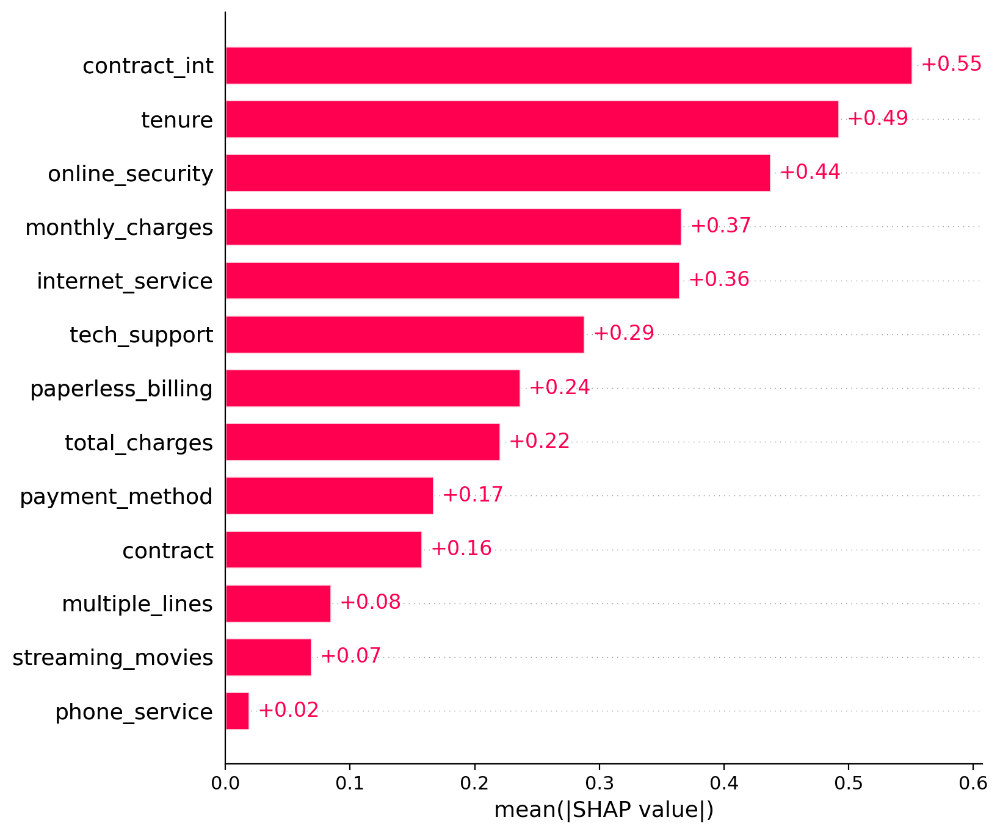

In [115]:
shap.plots.bar(shap_values, max_display=25)

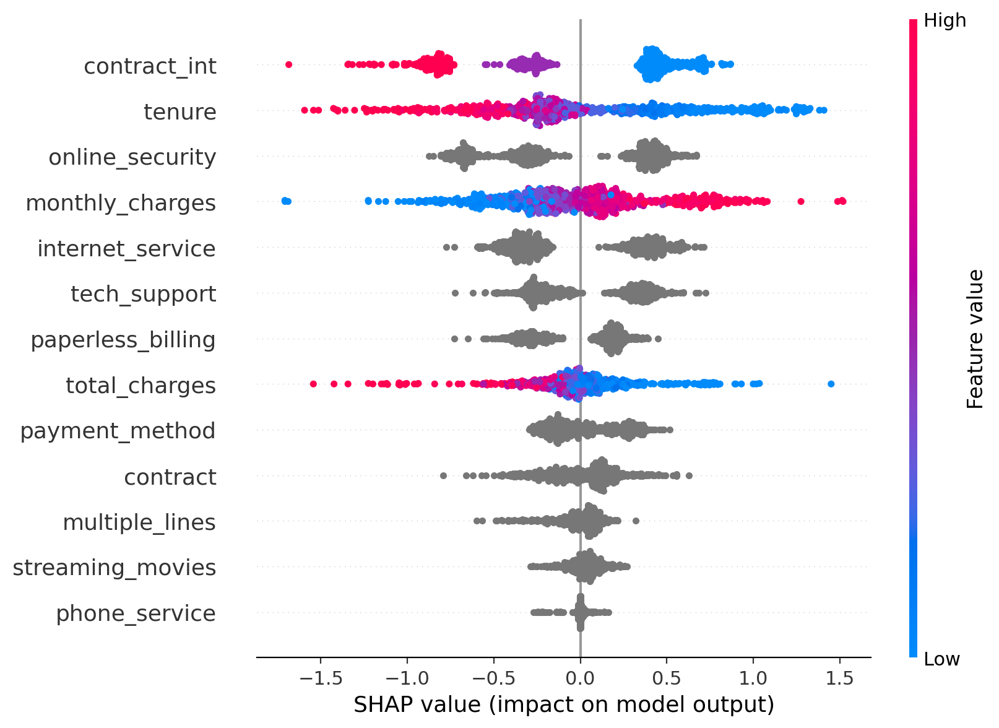

In [116]:
shap.plots.beeswarm(shap_values, max_display=25)

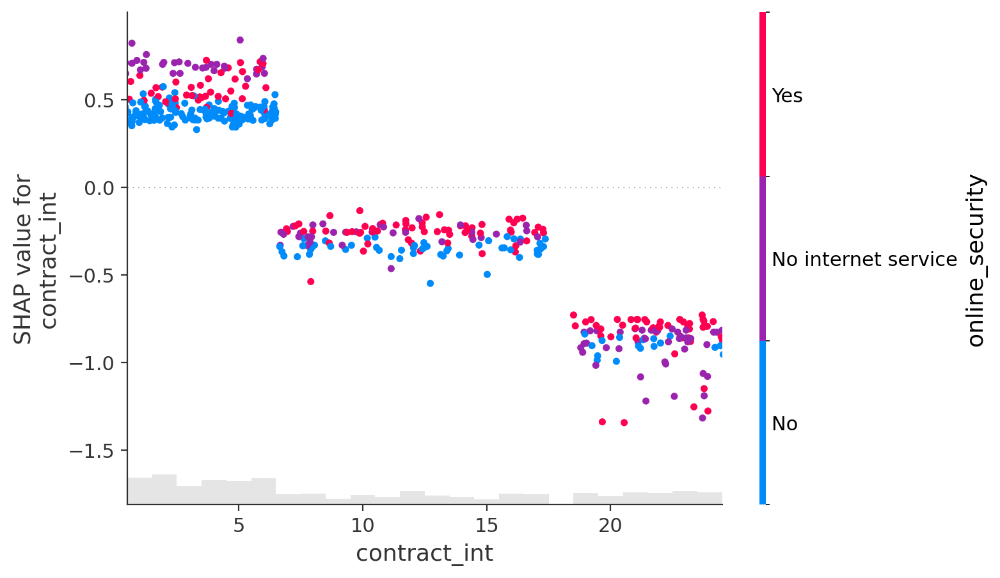

In [118]:
shap.plots.scatter(shap_values[:, "contract_int"], color=shap_values)

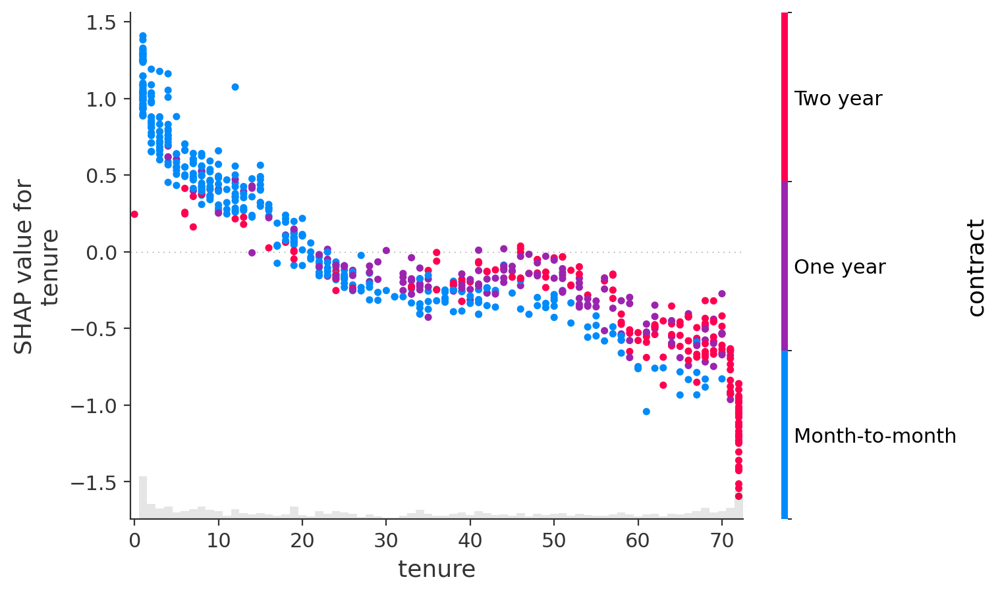

In [119]:
shap.plots.scatter(shap_values[:, "tenure"], color=shap_values)

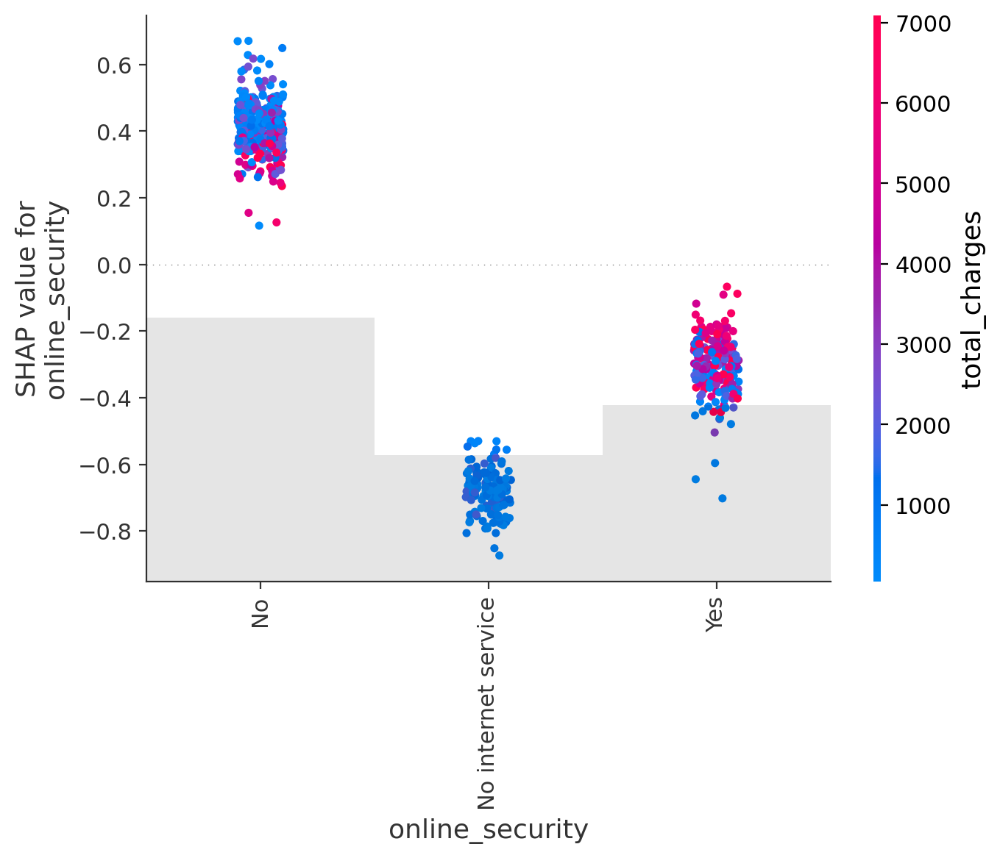

In [121]:
shap.plots.scatter(shap_values[:, "online_security"], color=shap_values)

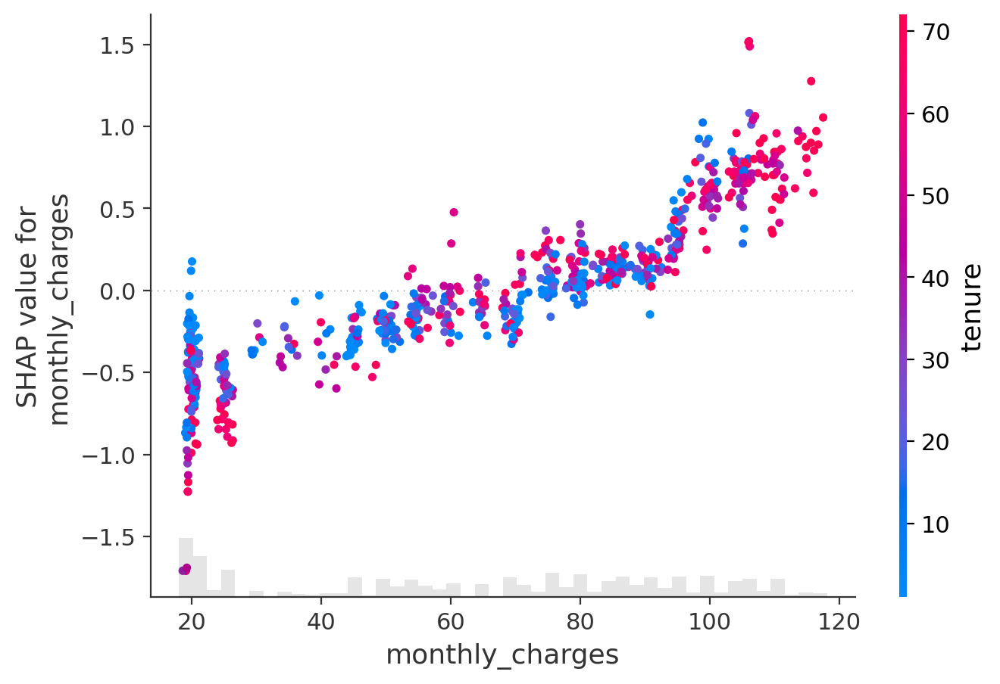

In [123]:
shap.plots.scatter(shap_values[:, "monthly_charges"], color=shap_values)

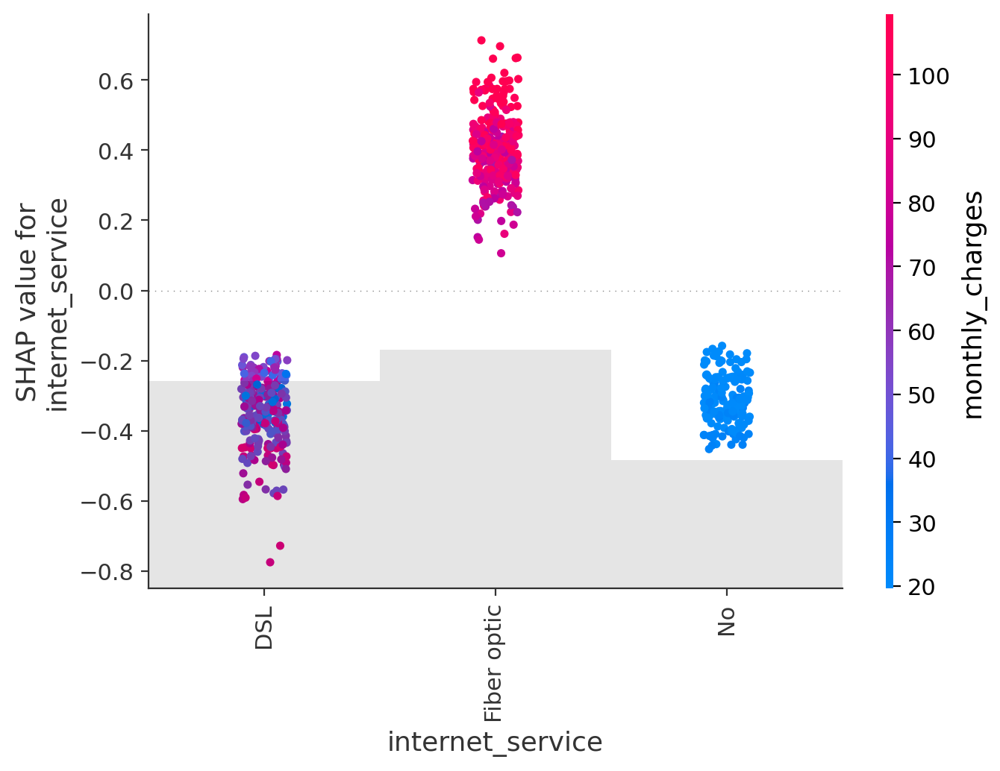

In [117]:
shap.plots.scatter(shap_values[:, "internet_service"], color=shap_values)

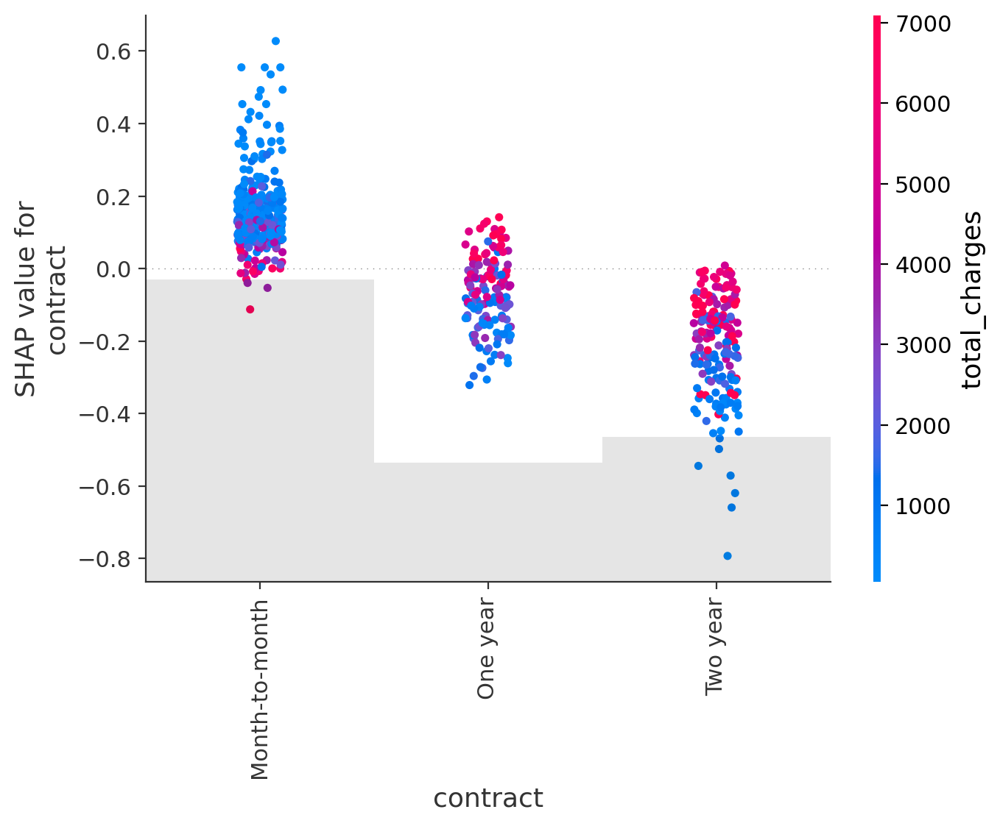

In [120]:
shap.plots.scatter(shap_values[:, "contract"], color=shap_values)

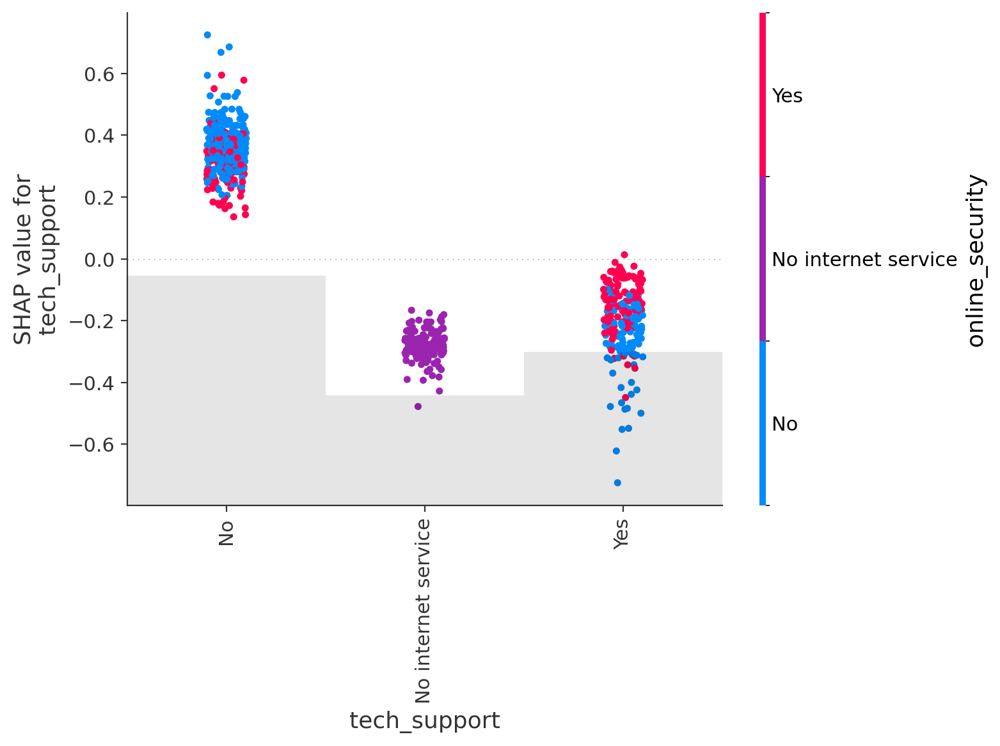

In [122]:
shap.plots.scatter(shap_values[:, "tech_support"], color=shap_values)

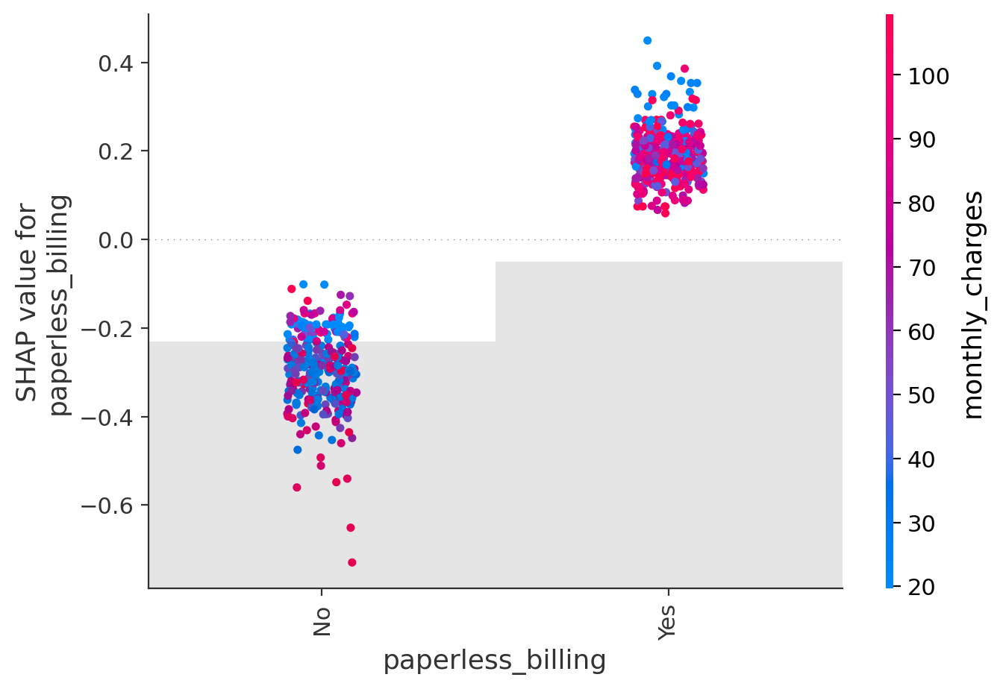

In [124]:
shap.plots.scatter(shap_values[:, "paperless_billing"], color=shap_values)

Из компании уходят те клиенты:   

которые:
1. много платят ежемесячно
2. являются новыми клиентами
3. с ежемесячной оплатой
4. платят много за высокоскоростной оптоволоконный интернет  

у которых:
1. нет тех. поддержки

# Финальная оценка

In [125]:
X_test_df = test_dataset.drop(["churn"], axis=1)
y_test_df = test_dataset.loc[:, "churn"]

In [126]:
X_test = catboost_pipe.transform(X_test_df)

y_test = y_label_encoder.transform(y_test_df)

X_test.shape, y_test.shape

/usr/local/lib/python3.12/dist-packages/sklearn/pipeline.py:62: FutureWarning: This Pipeline instance is not fitted yet. Call 'fit' with appropriate arguments before using other methods such as transform, predict, etc. This will raise an error in 1.8 instead of the current warning.
  warnings.warn(


((705, 13), (705,))

In [127]:
y_test_pred_proba = best_catboost_model.predict_proba(X_test)[:, 1]

final_avg_precision = metrics.average_precision_score(y_test, y_test_pred_proba)
print(f"Финальная pr-auc метрика на тестовом множестве: {final_avg_precision:.4f}")

Финальная pr-auc метрика на тестовом множестве: 0.6367


# Выводы
* Необходимо исправить заполнение колонок, так как есть явная ошибка в заполнении данных по клиентам (см. столбец total_charges).
* Скорее всего, как телефонная компания мы являемся конкурентоспособными, но, как только, необходимо подключить интернет, мы начинаем сдавать позиции на рынке.
* Образ клиента, который уходит из компании: новый клиент, платящий очень много за современное интернет оборудование без онлайн-защиты и без техподдержки
* Финальная метрика pr-auc на тестовом множестве: 0.6367